In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.preprocessing import LabelBinarizer
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
df =  pd.read_csv('DATA.csv')

In [3]:
df.head(10)

,Patient_ID,Systemic Illness,Rectal Pain,Sore Throat,Penile Oedema,Oral Lesions,Solitary Lesion,Swollen Tonsils,HIV Infection,Sexually Transmitted Infection,MonkeyPox
0,P0,None,False,True,True,True,False,True,False,False,Negative
1,P1,Fever,True,False,True,True,False,False,True,False,Positive
2,P2,Fever,False,True,True,False,False,False,True,False,Positive
3,P3,None,True,False,False,False,True,True,True,False,Positive
4,P4,Swollen Lymph Nodes,True,True,True,False,False,True,True,False,Positive
5,P5,Swollen Lymph Nodes,False,True,False,False,False,False,False,False,Negative
6,P6,Fever,False,True,False,False,False,False,True,False,Positive
7,P7,Fever,True,True,False,True,True,True,False,False,Positive
8,P8,Muscle Aches and Pain,False,True,True,True,False,False,False,False,Positive
9,P9,Fever,False,False,True,True,True,False,True,False,Negative


# **Data Pre-Processing**

In [4]:
df.isnull().sum()

Patient_ID                        0
Systemic Illness                  0
Rectal Pain                       0
Sore Throat                       0
Penile Oedema                     0
Oral Lesions                      0
Solitary Lesion                   0
Swollen Tonsils                   0
HIV Infection                     0
Sexually Transmitted Infection    0
MonkeyPox                         0
dtype: int64

In [5]:
df.drop(labels='Patient_ID', axis=1, inplace=True)
df.head()

,Systemic Illness,Rectal Pain,Sore Throat,Penile Oedema,Oral Lesions,Solitary Lesion,Swollen Tonsils,HIV Infection,Sexually Transmitted Infection,MonkeyPox
0,None,False,True,True,True,False,True,False,False,Negative
1,Fever,True,False,True,True,False,False,True,False,Positive
2,Fever,False,True,True,False,False,False,True,False,Positive
3,None,True,False,False,False,True,True,True,False,Positive
4,Swollen Lymph Nodes,True,True,True,False,False,True,True,False,Positive


In [6]:
df = df.replace(["Positive", "Negative", True, False], [1,0,1,0])
df.head()

,Systemic Illness,Rectal Pain,Sore Throat,Penile Oedema,Oral Lesions,Solitary Lesion,Swollen Tonsils,HIV Infection,Sexually Transmitted Infection,MonkeyPox
0,None,0,1,1,1,0,1,0,0,0
1,Fever,1,0,1,1,0,0,1,0,1
2,Fever,0,1,1,0,0,0,1,0,1
3,None,1,0,0,0,1,1,1,0,1
4,Swollen Lymph Nodes,1,1,1,0,0,1,1,0,1


In [7]:
df=pd.get_dummies(df,columns=['Systemic Illness'], drop_first= True)
df.head()

,Rectal Pain,Sore Throat,Penile Oedema,Oral Lesions,Solitary Lesion,Swollen Tonsils,HIV Infection,Sexually Transmitted Infection,MonkeyPox,Systemic Illness_Muscle Aches and Pain,Systemic Illness_None,Systemic Illness_Swollen Lymph Nodes
0,0,1,1,1,0,1,0,0,0,0,1,0
1,1,0,1,1,0,0,1,0,1,0,0,0
2,0,1,1,0,0,0,1,0,1,0,0,0
3,1,0,0,0,1,1,1,0,1,0,1,0
4,1,1,1,0,0,1,1,0,1,0,0,1


In [8]:
df['MonkeyPox'].value_counts()

1    15909
0     9091
Name: MonkeyPox, dtype: int64

# **Exploratory Data Analysis**



<AxesSubplot:xlabel='Systemic Illness_Muscle Aches and Pain', ylabel='Density'>

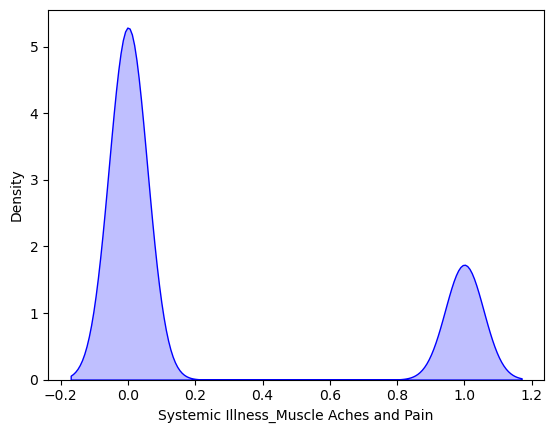

In [9]:
sns.kdeplot(x = 'Systemic Illness_Muscle Aches and Pain', data = df, color = 'blue', shade = True)

<AxesSubplot:xlabel='Sore Throat', ylabel='Density'>

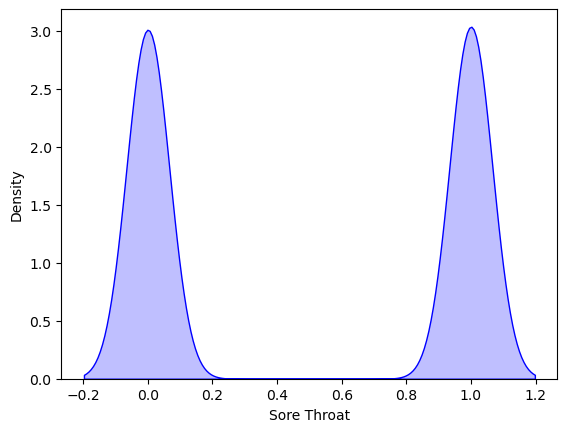

In [10]:
sns.kdeplot(x = 'Sore Throat', data = df, color = 'blue', shade = True)

<AxesSubplot:xlabel='MonkeyPox', ylabel='count'>

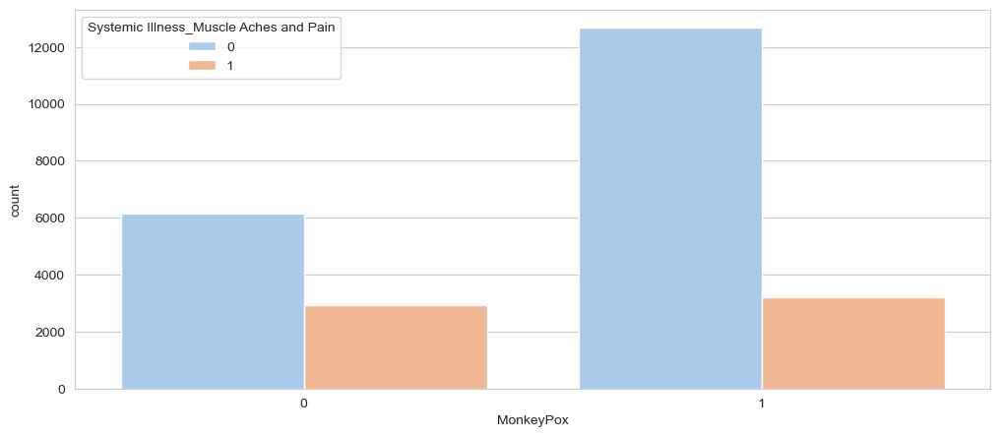

In [11]:
sns.set_style("whitegrid")
plt.figure(figsize=(12,5))
sns.countplot(x='MonkeyPox',hue='Systemic Illness_Muscle Aches and Pain',data=df, palette='pastel')

<AxesSubplot:xlabel='MonkeyPox', ylabel='count'>

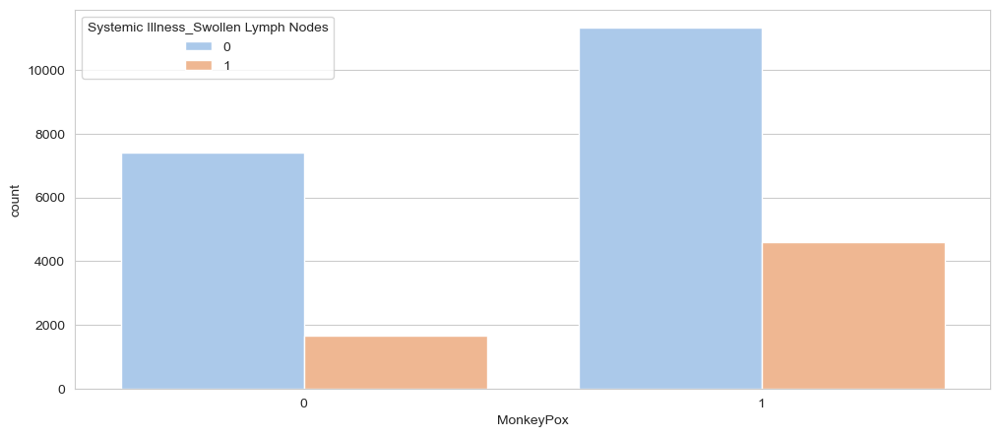

In [12]:
plt.figure(figsize=(12,5))
sns.countplot(x='MonkeyPox',hue='Systemic Illness_Swollen Lymph Nodes',data=df, palette='pastel')

<AxesSubplot:xlabel='Sore Throat', ylabel='count'>

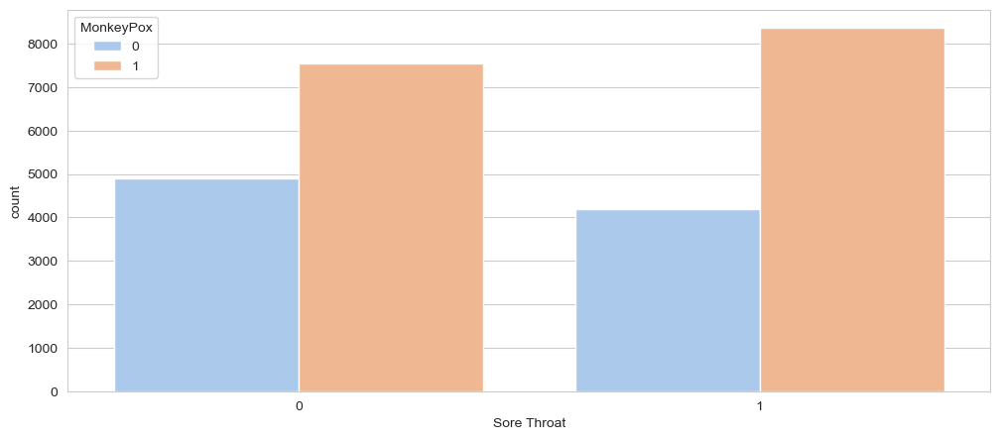

In [13]:
plt.figure(figsize=(12,5))
sns.countplot(x='Sore Throat',hue='MonkeyPox',data=df, palette='pastel')

<AxesSubplot:xlabel='Sexually Transmitted Infection', ylabel='count'>

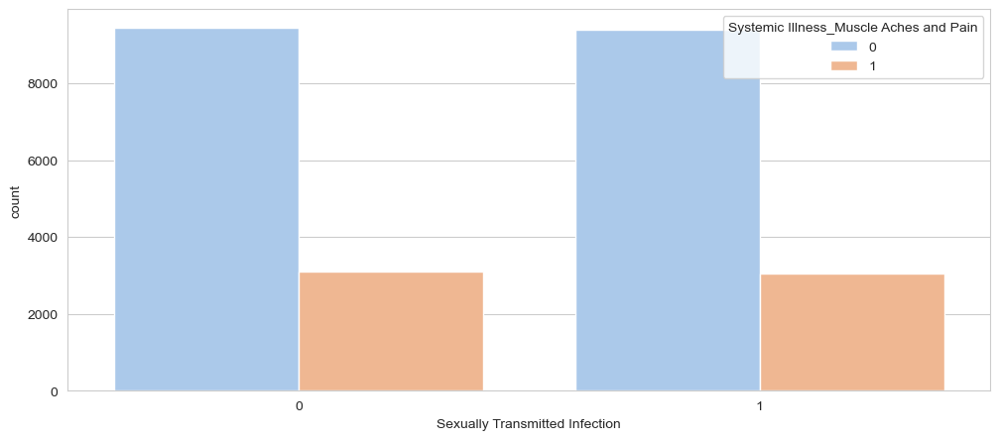

In [14]:
plt.figure(figsize=(12,5))
sns.countplot(x='Sexually Transmitted Infection',hue='Systemic Illness_Muscle Aches and Pain',data=df, palette='pastel')

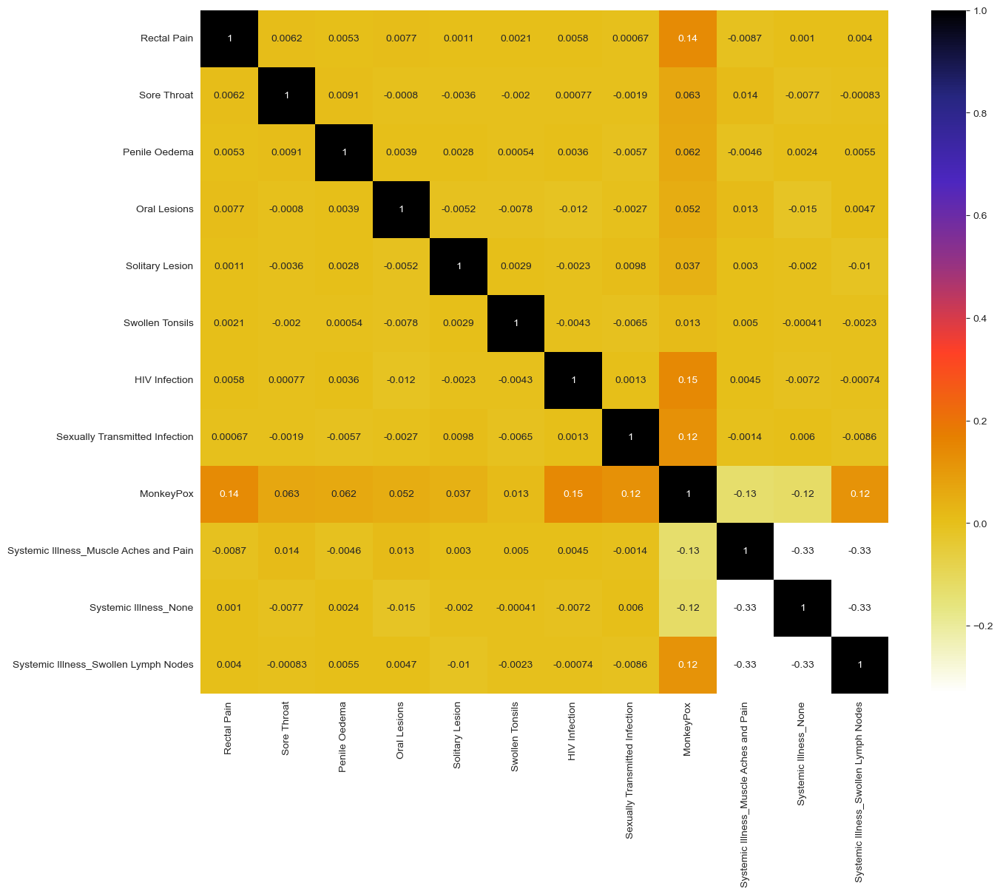

In [15]:
from matplotlib.pyplot import figure
plt.figure(figsize=(15,12))
sns.heatmap(df.corr(), cmap=plt.cm.CMRmap_r, annot = True)
plt.show()

# **Feature Selection**

In [16]:
from sklearn.model_selection import train_test_split
X = df.drop('MonkeyPox', axis=1)
y= df['MonkeyPox']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify = y)

In [17]:
df.dtypes

Rectal Pain                               int64
Sore Throat                               int64
Penile Oedema                             int64
Oral Lesions                              int64
Solitary Lesion                           int64
Swollen Tonsils                           int64
HIV Infection                             int64
Sexually Transmitted Infection            int64
MonkeyPox                                 int64
Systemic Illness_Muscle Aches and Pain    uint8
Systemic Illness_None                     uint8
Systemic Illness_Swollen Lymph Nodes      uint8
dtype: object

In [18]:
from sklearn.feature_selection import mutual_info_classif

mutual_info = mutual_info_classif(X_train, y_train, random_state = 101)
mutual_info


array([0.01642093, 0.        , 0.        , 0.00215182, 0.        ,
       0.00339663, 0.01084675, 0.00737749, 0.00441146, 0.0033591 ,
       0.00648629])

In [19]:
print(len(mutual_info))
print(X_train.shape)

11
(20000, 11)


In [20]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending = False)

Rectal Pain                               0.016421
HIV Infection                             0.010847
Sexually Transmitted Infection            0.007377
Systemic Illness_Swollen Lymph Nodes      0.006486
Systemic Illness_Muscle Aches and Pain    0.004411
Swollen Tonsils                           0.003397
Systemic Illness_None                     0.003359
Oral Lesions                              0.002152
Sore Throat                               0.000000
Penile Oedema                             0.000000
Solitary Lesion                           0.000000
dtype: float64

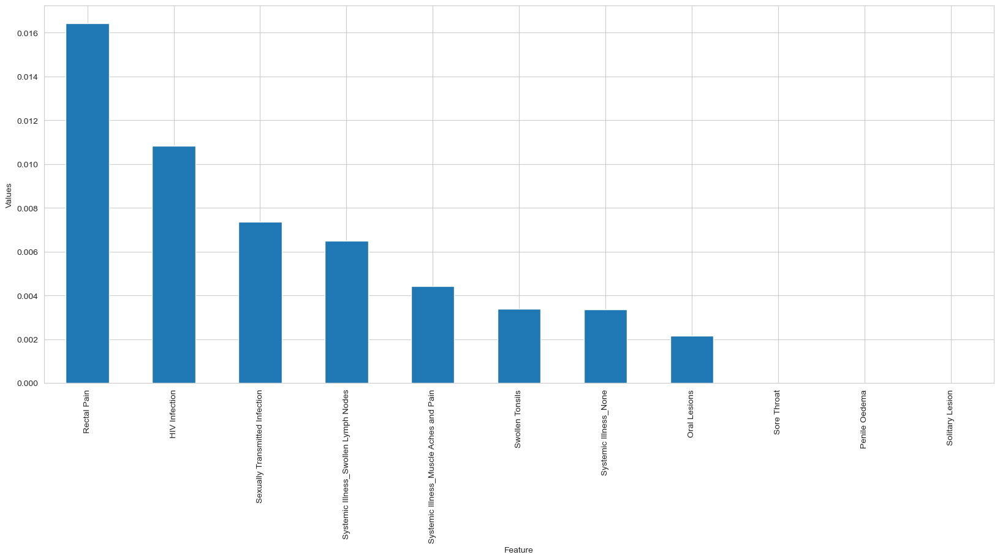

In [21]:
plt.figure(figsize = (20, 8))
plt.xlabel('Feature')
plt.ylabel('Values')
mutual_info.sort_values(ascending = False).plot.bar();

In [22]:
from sklearn.feature_selection import SelectKBest

In [23]:
sel_five_cols = SelectKBest(mutual_info_classif, k=8)
sel_five_cols.fit(X_train, y_train)
X_train.columns[sel_five_cols.get_support()]

Index(['Rectal Pain', 'Sore Throat', 'Oral Lesions', 'Swollen Tonsils',
       'HIV Infection', 'Sexually Transmitted Infection',
       'Systemic Illness_Muscle Aches and Pain',
       'Systemic Illness_Swollen Lymph Nodes'],
      dtype='object')

In [24]:
df= df.drop(['Solitary Lesion', 'Oral Lesions', 'Sore Throat'], axis=1)

# **Decision Tree**

In [25]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify = y)

In [27]:
dtree = DecisionTreeClassifier(random_state=42)

In [28]:
params =  {
    'min_samples_leaf': range(15,35),
    'max_depth': range(10,25),
    'criterion' : ['gini', 'entropy'],
    'max_features' : ['auto', 'sqrt', 'log2']
}

In [29]:
DT_grid = GridSearchCV(estimator=dtree,
                    param_grid=params,
                    cv=10,
                    n_jobs=1,
                    verbose=2)

In [30]:
DT_grid.fit(X_train, y_train)

Fitting 10 folds for each of 1800 candidates, totalling 18000 fits
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features

[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=17, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=19, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=21, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=22, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=gini, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=auto, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=sqrt, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=gini, max_depth=24, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=g

[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=21; total tim

[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=30; total tim

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=18; total tim

[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=27; total tim

[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=16; total tim

[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=24; total tim

[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=33; total tim

[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=22; total tim

[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=30; total tim

[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=19; total tim

[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=28; total tim

[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=16; total tim

[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=25; total tim

[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=33; total tim

[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=22; total tim

[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=31; total tim

[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=20; total tim

[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=28; total tim

[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=17; total tim

[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=26; total tim

[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=15; total tim

[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=23; total tim

[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=32; total tim

[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=20; total tim

[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=29; total tim

[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=18; total tim

[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=27; total tim

[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=15; total tim

[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=24; total tim

[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=33; total tim

[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=21; total tim

[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=30; total tim

[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=19; total tim

[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=28; total tim

[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=16; total tim

[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=24; total tim

[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=auto, min_samples_leaf=33; total tim

[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=21; total tim

[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=sqrt, min_samples_leaf=29; total tim

[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=18; total tim

[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=27; total tim

[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=15, max_features=log2, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=15; total tim

[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=23; total tim

[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=32; total tim

[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=21; total tim

[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=29; total tim

[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=18; total tim

[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=27; total tim

[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=16; total tim

[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=24; total tim

[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=auto, min_samples_leaf=33; total tim

[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=21; total tim

[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=sqrt, min_samples_leaf=30; total tim

[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=19; total tim

[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=17, max_features=log2, min_samples_leaf=28; total tim

[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=16; total tim

[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=25; total tim

[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=34; total tim

[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=22; total tim

[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=30; total tim

[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=19; total tim

[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=28; total tim

[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=17; total tim

[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=25; total tim

[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=auto, min_samples_leaf=33; total tim

[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=22; total tim

[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=sqrt, min_samples_leaf=30; total tim

[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=19; total tim

[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=19, max_features=log2, min_samples_leaf=28; total tim

[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=16; total tim

[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=25; total tim

[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=33; total tim

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=22; total tim

[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=31; total tim

[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=19; total tim

[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=28; total tim

[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=17; total tim

[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=26; total tim

[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=auto, min_samples_leaf=34; total tim

[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=23; total tim

[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=sqrt, min_samples_leaf=31; total tim

[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=19; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=20; total tim

[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=21, max_features=log2, min_samples_leaf=28; total tim

[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=16; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=17; total tim

[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=25; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=26; total tim

[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=auto, min_samples_leaf=34; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=15; total tim

[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=24; total tim

[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=sqrt, min_samples_leaf=33; total tim

[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=21; total tim

[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=22, max_features=log2, min_samples_leaf=30; total tim

[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=17; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=18; total tim

[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=auto, min_samples_leaf=27; total tim

[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=16; total tim

[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=24; total tim

[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=33; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=sqrt, min_samples_leaf=33; total tim

[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=21; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=22; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=22; total tim

[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=30; total time=   0.0s
[CV] END criterion=entropy, max_depth=23, max_features=log2, min_samples_leaf=30; total tim

[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=18; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=19; total tim

[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=26; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=27; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=auto, min_samples_leaf=27; total tim

[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=15; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=15; total tim

[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=23; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=24; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=24; total tim

[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=31; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=32; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=sqrt, min_samples_leaf=32; total tim

[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=20; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=21; total tim

[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=28; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=29; total time=   0.0s
[CV] END criterion=entropy, max_depth=24, max_features=log2, min_samples_leaf=29; total tim

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=42), n_jobs=1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(10, 25),
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': range(15, 35)},
             verbose=2)

In [31]:
DT_grid.best_params_

{'criterion': 'gini',
 'max_depth': 11,
 'max_features': 'auto',
 'min_samples_leaf': 24}

In [32]:
dtree= DecisionTreeClassifier(criterion='gini',
 max_depth=11,
 max_features='auto',
 min_samples_leaf=24)

In [33]:
dtree.fit(X_train,y_train)
prediction=dtree.predict(X_test)

In [34]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

print(classification_report(y_test,prediction))
print("Train Accuracy: ", accuracy_score(y_train, dtree.predict(X_train))) # compare training actual and predicted value
print("Test Accuracy: ", accuracy_score(y_test, prediction))

              precision    recall  f1-score   support

           0       0.63      0.33      0.43      1818
           1       0.70      0.89      0.78      3182

    accuracy                           0.69      5000
   macro avg       0.66      0.61      0.61      5000
weighted avg       0.67      0.69      0.66      5000

Train Accuracy:  0.6997
Test Accuracy:  0.6852


In [35]:
cf_matrix=confusion_matrix(y_test,prediction)

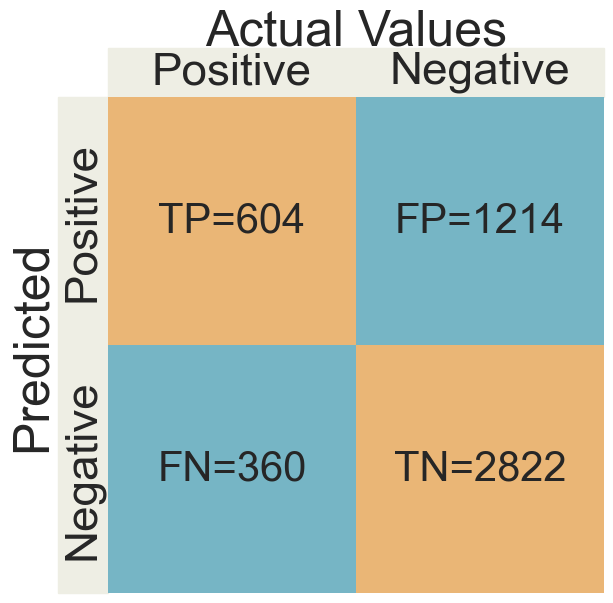

In [36]:
cm = cf_matrix
sns.set(font_scale=3)
plt.figure(figsize=(7, 7))
ax = sns.heatmap(data=[[1, 0], [0, 1]], cmap=sns.color_palette(['#76b5c5', '#eab676'], as_cmap=True),
                 annot=[[f"TP={cm[0][0]:.0f}", f"FP={cm[0][1]:.0f}"], [f"FN={cm[1][0]:.0f}", f"TN={cm[1][1]:.0f}"]],
                 fmt='', annot_kws={'fontsize': 30}, cbar=False, square=True)

ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted')
ax.tick_params(length=0, labeltop=True, labelbottom=False)
ax.xaxis.set_label_position('top')
ax.set_xticklabels(['Positive', 'Negative'])
ax.set_yticklabels(['Positive', 'Negative'], rotation=90, va='center')
ax.add_patch(plt.Rectangle((0, 1), 1, 0.1, color='#eeeee4', clip_on=False, zorder=0, transform=ax.transAxes))
ax.add_patch(plt.Rectangle((0, 0), -0.1, 1, color='#eeeee4', clip_on=False, zorder=0, transform=ax.transAxes))
plt.tight_layout()
plt.show()

In [37]:
%pip install lime

import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['0', '1'], # Check your class names in the CSV file. It should be 1, 2, 3, 4, 5 I think
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=X_test.iloc[10],
    predict_fn=dtree.predict_proba
)

exp.show_in_notebook(show_table=True)

Note: you may need to restart the kernel to use updated packages.


# **Random Forest**

In [38]:
from sklearn.ensemble import RandomForestClassifier

In [39]:
rfc=RandomForestClassifier(random_state = 42)

In [40]:
params =  {
    'n_estimators' :  [31, 32, 34, 35, 36, 37, 40],
    'min_samples_leaf': [1,2, 3, 5],
    'max_depth': [5, 6, 7, 8],
    'max_features' : ['sqrt', 'log2']
   
}

In [41]:
rfc_grid = GridSearchCV(estimator=rfc,
                    param_grid=params,
                    cv=10,
                    n_jobs=1,
                    verbose=3)

In [42]:
rfc_grid.fit(X_train, y_train)

Fitting 10 folds for each of 224 candidates, totalling 2240 fits
[CV 1/10] END max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=31;, score=0.692 total time=   0.2s
[CV 2/10] END max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=31;, score=0.688 total time=   0.2s
[CV 3/10] END max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=31;, score=0.679 total time=   0.2s
[CV 4/10] END max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=31;, score=0.682 total time=   0.2s
[CV 5/10] END max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=31;, score=0.686 total time=   0.2s
[CV 6/10] END max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=31;, score=0.688 total time=   0.2s
[CV 7/10] END max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=31;, score=0.699 total time=   0.2s
[CV 8/10] END max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=31;, score=0.696 total time=   0.2s
[CV 9/10] END m

[CV 2/10] END max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=31;, score=0.688 total time=   0.2s
[CV 3/10] END max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=31;, score=0.679 total time=   0.4s
[CV 4/10] END max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=31;, score=0.682 total time=   0.1s
[CV 5/10] END max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=31;, score=0.686 total time=   0.1s
[CV 6/10] END max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=31;, score=0.688 total time=   0.1s
[CV 7/10] END max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=31;, score=0.699 total time=   0.1s
[CV 8/10] END max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=31;, score=0.696 total time=   0.1s
[CV 9/10] END max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=31;, score=0.695 total time=   0.1s
[CV 10/10] END max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=

[CV 4/10] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=31;, score=0.682 total time=   0.5s
[CV 5/10] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=31;, score=0.686 total time=   0.4s
[CV 6/10] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=31;, score=0.688 total time=   0.4s
[CV 7/10] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=31;, score=0.699 total time=   0.2s
[CV 8/10] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=31;, score=0.696 total time=   0.1s
[CV 9/10] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=31;, score=0.695 total time=   0.2s
[CV 10/10] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=31;, score=0.672 total time=   0.4s
[CV 1/10] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=32;, score=0.694 total time=   0.3s
[CV 2/10] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=

[CV 6/10] END max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=31;, score=0.688 total time=   0.1s
[CV 7/10] END max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=31;, score=0.699 total time=   0.1s
[CV 8/10] END max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=31;, score=0.696 total time=   0.1s
[CV 9/10] END max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=31;, score=0.695 total time=   0.1s
[CV 10/10] END max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=31;, score=0.672 total time=   0.1s
[CV 1/10] END max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=32;, score=0.694 total time=   0.1s
[CV 2/10] END max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=32;, score=0.689 total time=   0.1s
[CV 3/10] END max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=32;, score=0.678 total time=   0.1s
[CV 4/10] END max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=

[CV 8/10] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=31;, score=0.696 total time=   0.1s
[CV 9/10] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=31;, score=0.695 total time=   0.1s
[CV 10/10] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=31;, score=0.672 total time=   0.1s
[CV 1/10] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=32;, score=0.694 total time=   0.1s
[CV 2/10] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=32;, score=0.689 total time=   0.1s
[CV 3/10] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=32;, score=0.678 total time=   0.1s
[CV 4/10] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=32;, score=0.684 total time=   0.1s
[CV 5/10] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=32;, score=0.688 total time=   0.1s
[CV 6/10] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=

[CV 10/10] END max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=31;, score=0.672 total time=   0.3s
[CV 1/10] END max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=32;, score=0.694 total time=   0.2s
[CV 2/10] END max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=32;, score=0.689 total time=   0.2s
[CV 3/10] END max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=32;, score=0.678 total time=   0.2s
[CV 4/10] END max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=32;, score=0.684 total time=   0.4s
[CV 5/10] END max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=32;, score=0.688 total time=   0.4s
[CV 6/10] END max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=32;, score=0.688 total time=   0.4s
[CV 7/10] END max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=32;, score=0.698 total time=   0.2s
[CV 8/10] END max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=

[CV 2/10] END max_depth=5, max_features=log2, min_samples_leaf=3, n_estimators=32;, score=0.689 total time=   0.4s
[CV 3/10] END max_depth=5, max_features=log2, min_samples_leaf=3, n_estimators=32;, score=0.678 total time=   0.2s
[CV 4/10] END max_depth=5, max_features=log2, min_samples_leaf=3, n_estimators=32;, score=0.684 total time=   0.4s
[CV 5/10] END max_depth=5, max_features=log2, min_samples_leaf=3, n_estimators=32;, score=0.688 total time=   0.3s
[CV 6/10] END max_depth=5, max_features=log2, min_samples_leaf=3, n_estimators=32;, score=0.688 total time=   0.2s
[CV 7/10] END max_depth=5, max_features=log2, min_samples_leaf=3, n_estimators=32;, score=0.698 total time=   0.3s
[CV 8/10] END max_depth=5, max_features=log2, min_samples_leaf=3, n_estimators=32;, score=0.693 total time=   0.3s
[CV 9/10] END max_depth=5, max_features=log2, min_samples_leaf=3, n_estimators=32;, score=0.693 total time=   0.1s
[CV 10/10] END max_depth=5, max_features=log2, min_samples_leaf=3, n_estimators=

[CV 4/10] END max_depth=5, max_features=log2, min_samples_leaf=5, n_estimators=32;, score=0.684 total time=   0.4s
[CV 5/10] END max_depth=5, max_features=log2, min_samples_leaf=5, n_estimators=32;, score=0.688 total time=   0.4s
[CV 6/10] END max_depth=5, max_features=log2, min_samples_leaf=5, n_estimators=32;, score=0.688 total time=   0.3s
[CV 7/10] END max_depth=5, max_features=log2, min_samples_leaf=5, n_estimators=32;, score=0.698 total time=   0.2s
[CV 8/10] END max_depth=5, max_features=log2, min_samples_leaf=5, n_estimators=32;, score=0.693 total time=   0.2s
[CV 9/10] END max_depth=5, max_features=log2, min_samples_leaf=5, n_estimators=32;, score=0.693 total time=   0.3s
[CV 10/10] END max_depth=5, max_features=log2, min_samples_leaf=5, n_estimators=32;, score=0.674 total time=   0.2s
[CV 1/10] END max_depth=5, max_features=log2, min_samples_leaf=5, n_estimators=34;, score=0.693 total time=   0.1s
[CV 2/10] END max_depth=5, max_features=log2, min_samples_leaf=5, n_estimators=

[CV 6/10] END max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=32;, score=0.694 total time=   0.2s
[CV 7/10] END max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=32;, score=0.702 total time=   0.1s
[CV 8/10] END max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=32;, score=0.695 total time=   0.1s
[CV 9/10] END max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=32;, score=0.697 total time=   0.2s
[CV 10/10] END max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=32;, score=0.676 total time=   0.1s
[CV 1/10] END max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=34;, score=0.696 total time=   0.3s
[CV 2/10] END max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=34;, score=0.696 total time=   0.3s
[CV 3/10] END max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=34;, score=0.682 total time=   0.3s
[CV 4/10] END max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=

[CV 8/10] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=32;, score=0.695 total time=   0.1s
[CV 9/10] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=32;, score=0.697 total time=   0.1s
[CV 10/10] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=32;, score=0.676 total time=   0.1s
[CV 1/10] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=34;, score=0.696 total time=   0.1s
[CV 2/10] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=34;, score=0.696 total time=   0.1s
[CV 3/10] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=34;, score=0.682 total time=   0.1s
[CV 4/10] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=34;, score=0.686 total time=   0.2s
[CV 5/10] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=34;, score=0.687 total time=   0.2s
[CV 6/10] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=

[CV 10/10] END max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=32;, score=0.676 total time=   0.5s
[CV 1/10] END max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=34;, score=0.696 total time=   0.5s
[CV 2/10] END max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=34;, score=0.696 total time=   0.3s
[CV 3/10] END max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=34;, score=0.682 total time=   0.3s
[CV 4/10] END max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=34;, score=0.686 total time=   0.6s
[CV 5/10] END max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=34;, score=0.687 total time=   0.6s
[CV 6/10] END max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=34;, score=0.695 total time=   0.6s
[CV 7/10] END max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=34;, score=0.701 total time=   0.6s
[CV 8/10] END max_depth=6, max_features=sqrt, min_samples_leaf=3, n_estimators=

[CV 2/10] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=34;, score=0.696 total time=   0.3s
[CV 3/10] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=34;, score=0.682 total time=   0.3s
[CV 4/10] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=34;, score=0.686 total time=   0.3s
[CV 5/10] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=34;, score=0.687 total time=   0.7s
[CV 6/10] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=34;, score=0.695 total time=   0.6s
[CV 7/10] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=34;, score=0.701 total time=   0.4s
[CV 8/10] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=34;, score=0.695 total time=   0.4s
[CV 9/10] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=34;, score=0.696 total time=   0.7s
[CV 10/10] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=

[CV 4/10] END max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=34;, score=0.686 total time=   0.5s
[CV 5/10] END max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=34;, score=0.687 total time=   0.3s
[CV 6/10] END max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=34;, score=0.695 total time=   0.3s
[CV 7/10] END max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=34;, score=0.701 total time=   0.3s
[CV 8/10] END max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=34;, score=0.695 total time=   0.3s
[CV 9/10] END max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=34;, score=0.696 total time=   0.4s
[CV 10/10] END max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=34;, score=0.679 total time=   0.7s
[CV 1/10] END max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=35;, score=0.698 total time=   0.7s
[CV 2/10] END max_depth=6, max_features=log2, min_samples_leaf=1, n_estimators=

[CV 6/10] END max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=34;, score=0.695 total time=   0.2s
[CV 7/10] END max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=34;, score=0.701 total time=   0.2s
[CV 8/10] END max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=34;, score=0.695 total time=   0.3s
[CV 9/10] END max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=34;, score=0.696 total time=   0.4s
[CV 10/10] END max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=34;, score=0.679 total time=   0.2s
[CV 1/10] END max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=35;, score=0.698 total time=   0.4s
[CV 2/10] END max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=35;, score=0.696 total time=   0.5s
[CV 3/10] END max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=35;, score=0.682 total time=   0.4s
[CV 4/10] END max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=

[CV 8/10] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=34;, score=0.695 total time=   0.3s
[CV 9/10] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=34;, score=0.696 total time=   0.3s
[CV 10/10] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=34;, score=0.679 total time=   0.4s
[CV 1/10] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=35;, score=0.698 total time=   0.3s
[CV 2/10] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=35;, score=0.696 total time=   0.3s
[CV 3/10] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=35;, score=0.682 total time=   0.3s
[CV 4/10] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=35;, score=0.686 total time=   0.2s
[CV 5/10] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=35;, score=0.686 total time=   0.3s
[CV 6/10] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=

[CV 10/10] END max_depth=6, max_features=log2, min_samples_leaf=5, n_estimators=34;, score=0.679 total time=   0.4s
[CV 1/10] END max_depth=6, max_features=log2, min_samples_leaf=5, n_estimators=35;, score=0.698 total time=   0.4s
[CV 2/10] END max_depth=6, max_features=log2, min_samples_leaf=5, n_estimators=35;, score=0.696 total time=   0.2s
[CV 3/10] END max_depth=6, max_features=log2, min_samples_leaf=5, n_estimators=35;, score=0.682 total time=   0.2s
[CV 4/10] END max_depth=6, max_features=log2, min_samples_leaf=5, n_estimators=35;, score=0.686 total time=   0.2s
[CV 5/10] END max_depth=6, max_features=log2, min_samples_leaf=5, n_estimators=35;, score=0.686 total time=   0.2s
[CV 6/10] END max_depth=6, max_features=log2, min_samples_leaf=5, n_estimators=35;, score=0.695 total time=   0.2s
[CV 7/10] END max_depth=6, max_features=log2, min_samples_leaf=5, n_estimators=35;, score=0.703 total time=   0.2s
[CV 8/10] END max_depth=6, max_features=log2, min_samples_leaf=5, n_estimators=

[CV 2/10] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=35;, score=0.699 total time=   0.3s
[CV 3/10] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=35;, score=0.680 total time=   0.3s
[CV 4/10] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=35;, score=0.692 total time=   0.3s
[CV 5/10] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=35;, score=0.688 total time=   0.5s
[CV 6/10] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=35;, score=0.697 total time=   0.3s
[CV 7/10] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=35;, score=0.702 total time=   0.3s
[CV 8/10] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=35;, score=0.697 total time=   0.3s
[CV 9/10] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=35;, score=0.700 total time=   0.3s
[CV 10/10] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=

[CV 4/10] END max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=35;, score=0.692 total time=   0.3s
[CV 5/10] END max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=35;, score=0.688 total time=   0.3s
[CV 6/10] END max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=35;, score=0.697 total time=   0.3s
[CV 7/10] END max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=35;, score=0.702 total time=   0.3s
[CV 8/10] END max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=35;, score=0.697 total time=   0.3s
[CV 9/10] END max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=35;, score=0.700 total time=   0.3s
[CV 10/10] END max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=35;, score=0.679 total time=   0.3s
[CV 1/10] END max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=36;, score=0.692 total time=   0.3s
[CV 2/10] END max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=

[CV 6/10] END max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=35;, score=0.697 total time=   0.6s
[CV 7/10] END max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=35;, score=0.702 total time=   0.6s
[CV 8/10] END max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=35;, score=0.697 total time=   0.8s
[CV 9/10] END max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=35;, score=0.700 total time=   0.4s
[CV 10/10] END max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=35;, score=0.679 total time=   0.3s
[CV 1/10] END max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=36;, score=0.692 total time=   0.5s
[CV 2/10] END max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=36;, score=0.700 total time=   0.3s
[CV 3/10] END max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=36;, score=0.681 total time=   0.4s
[CV 4/10] END max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=

[CV 8/10] END max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=35;, score=0.697 total time=   0.3s
[CV 9/10] END max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=35;, score=0.700 total time=   0.2s
[CV 10/10] END max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=35;, score=0.679 total time=   0.3s
[CV 1/10] END max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=36;, score=0.692 total time=   0.3s
[CV 2/10] END max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=36;, score=0.700 total time=   0.3s
[CV 3/10] END max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=36;, score=0.681 total time=   0.3s
[CV 4/10] END max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=36;, score=0.690 total time=   0.3s
[CV 5/10] END max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=36;, score=0.691 total time=   0.3s
[CV 6/10] END max_depth=7, max_features=sqrt, min_samples_leaf=5, n_estimators=

[CV 10/10] END max_depth=7, max_features=log2, min_samples_leaf=1, n_estimators=35;, score=0.679 total time=   0.5s
[CV 1/10] END max_depth=7, max_features=log2, min_samples_leaf=1, n_estimators=36;, score=0.692 total time=   0.4s
[CV 2/10] END max_depth=7, max_features=log2, min_samples_leaf=1, n_estimators=36;, score=0.700 total time=   0.5s
[CV 3/10] END max_depth=7, max_features=log2, min_samples_leaf=1, n_estimators=36;, score=0.681 total time=   0.6s
[CV 4/10] END max_depth=7, max_features=log2, min_samples_leaf=1, n_estimators=36;, score=0.690 total time=   0.6s
[CV 5/10] END max_depth=7, max_features=log2, min_samples_leaf=1, n_estimators=36;, score=0.691 total time=   0.7s
[CV 6/10] END max_depth=7, max_features=log2, min_samples_leaf=1, n_estimators=36;, score=0.697 total time=   0.7s
[CV 7/10] END max_depth=7, max_features=log2, min_samples_leaf=1, n_estimators=36;, score=0.703 total time=   0.7s
[CV 8/10] END max_depth=7, max_features=log2, min_samples_leaf=1, n_estimators=

[CV 2/10] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=36;, score=0.700 total time=   0.3s
[CV 3/10] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=36;, score=0.681 total time=   0.3s
[CV 4/10] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=36;, score=0.690 total time=   0.3s
[CV 5/10] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=36;, score=0.691 total time=   0.3s
[CV 6/10] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=36;, score=0.697 total time=   0.3s
[CV 7/10] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=36;, score=0.703 total time=   0.3s
[CV 8/10] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=36;, score=0.694 total time=   0.3s
[CV 9/10] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=36;, score=0.700 total time=   0.3s
[CV 10/10] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=

[CV 4/10] END max_depth=7, max_features=log2, min_samples_leaf=3, n_estimators=36;, score=0.690 total time=   0.3s
[CV 5/10] END max_depth=7, max_features=log2, min_samples_leaf=3, n_estimators=36;, score=0.691 total time=   0.3s
[CV 6/10] END max_depth=7, max_features=log2, min_samples_leaf=3, n_estimators=36;, score=0.697 total time=   0.3s
[CV 7/10] END max_depth=7, max_features=log2, min_samples_leaf=3, n_estimators=36;, score=0.703 total time=   0.3s
[CV 8/10] END max_depth=7, max_features=log2, min_samples_leaf=3, n_estimators=36;, score=0.694 total time=   0.3s
[CV 9/10] END max_depth=7, max_features=log2, min_samples_leaf=3, n_estimators=36;, score=0.700 total time=   0.3s
[CV 10/10] END max_depth=7, max_features=log2, min_samples_leaf=3, n_estimators=36;, score=0.678 total time=   0.3s
[CV 1/10] END max_depth=7, max_features=log2, min_samples_leaf=3, n_estimators=37;, score=0.690 total time=   0.3s
[CV 2/10] END max_depth=7, max_features=log2, min_samples_leaf=3, n_estimators=

[CV 6/10] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=36;, score=0.697 total time=   0.3s
[CV 7/10] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=36;, score=0.703 total time=   0.3s
[CV 8/10] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=36;, score=0.694 total time=   0.3s
[CV 9/10] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=36;, score=0.700 total time=   0.3s
[CV 10/10] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=36;, score=0.678 total time=   0.3s
[CV 1/10] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=37;, score=0.690 total time=   0.3s
[CV 2/10] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=37;, score=0.700 total time=   0.3s
[CV 3/10] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=37;, score=0.682 total time=   0.3s
[CV 4/10] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=

[CV 8/10] END max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=36;, score=0.690 total time=   0.6s
[CV 9/10] END max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=36;, score=0.699 total time=   0.7s
[CV 10/10] END max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=36;, score=0.676 total time=   0.7s
[CV 1/10] END max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=37;, score=0.685 total time=   0.6s
[CV 2/10] END max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=37;, score=0.694 total time=   0.6s
[CV 3/10] END max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=37;, score=0.677 total time=   0.6s
[CV 4/10] END max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=37;, score=0.692 total time=   0.4s
[CV 5/10] END max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=37;, score=0.694 total time=   0.4s
[CV 6/10] END max_depth=8, max_features=sqrt, min_samples_leaf=1, n_estimators=

[CV 10/10] END max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=36;, score=0.676 total time=   0.4s
[CV 1/10] END max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=37;, score=0.685 total time=   0.4s
[CV 2/10] END max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=37;, score=0.694 total time=   0.4s
[CV 3/10] END max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=37;, score=0.677 total time=   0.5s
[CV 4/10] END max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=37;, score=0.692 total time=   0.6s
[CV 5/10] END max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=37;, score=0.694 total time=   0.6s
[CV 6/10] END max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=37;, score=0.691 total time=   0.8s
[CV 7/10] END max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=37;, score=0.708 total time=   0.9s
[CV 8/10] END max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=

[CV 2/10] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=37;, score=0.694 total time=   0.5s
[CV 3/10] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=37;, score=0.677 total time=   0.6s
[CV 4/10] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=37;, score=0.692 total time=   0.4s
[CV 5/10] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=37;, score=0.694 total time=   0.4s
[CV 6/10] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=37;, score=0.691 total time=   0.4s
[CV 7/10] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=37;, score=0.708 total time=   0.3s
[CV 8/10] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=37;, score=0.688 total time=   0.4s
[CV 9/10] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=37;, score=0.700 total time=   0.4s
[CV 10/10] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=

[CV 4/10] END max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=37;, score=0.692 total time=   0.5s
[CV 5/10] END max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=37;, score=0.694 total time=   0.5s
[CV 6/10] END max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=37;, score=0.691 total time=   0.4s
[CV 7/10] END max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=37;, score=0.708 total time=   0.4s
[CV 8/10] END max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=37;, score=0.688 total time=   0.4s
[CV 9/10] END max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=37;, score=0.700 total time=   0.5s
[CV 10/10] END max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=37;, score=0.676 total time=   0.4s
[CV 1/10] END max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=40;, score=0.684 total time=   0.3s
[CV 2/10] END max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=

[CV 6/10] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=37;, score=0.691 total time=   0.4s
[CV 7/10] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=37;, score=0.708 total time=   0.4s
[CV 8/10] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=37;, score=0.688 total time=   0.4s
[CV 9/10] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=37;, score=0.700 total time=   0.4s
[CV 10/10] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=37;, score=0.676 total time=   0.4s
[CV 1/10] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=40;, score=0.684 total time=   0.4s
[CV 2/10] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=40;, score=0.694 total time=   0.4s
[CV 3/10] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=40;, score=0.678 total time=   0.4s
[CV 4/10] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=

[CV 8/10] END max_depth=8, max_features=log2, min_samples_leaf=2, n_estimators=37;, score=0.688 total time=   0.6s
[CV 9/10] END max_depth=8, max_features=log2, min_samples_leaf=2, n_estimators=37;, score=0.700 total time=   0.7s
[CV 10/10] END max_depth=8, max_features=log2, min_samples_leaf=2, n_estimators=37;, score=0.676 total time=   0.6s
[CV 1/10] END max_depth=8, max_features=log2, min_samples_leaf=2, n_estimators=40;, score=0.684 total time=   0.7s
[CV 2/10] END max_depth=8, max_features=log2, min_samples_leaf=2, n_estimators=40;, score=0.694 total time=   0.7s
[CV 3/10] END max_depth=8, max_features=log2, min_samples_leaf=2, n_estimators=40;, score=0.678 total time=   0.6s
[CV 4/10] END max_depth=8, max_features=log2, min_samples_leaf=2, n_estimators=40;, score=0.690 total time=   0.4s
[CV 5/10] END max_depth=8, max_features=log2, min_samples_leaf=2, n_estimators=40;, score=0.695 total time=   0.4s
[CV 6/10] END max_depth=8, max_features=log2, min_samples_leaf=2, n_estimators=

[CV 10/10] END max_depth=8, max_features=log2, min_samples_leaf=3, n_estimators=37;, score=0.676 total time=   0.5s
[CV 1/10] END max_depth=8, max_features=log2, min_samples_leaf=3, n_estimators=40;, score=0.684 total time=   0.6s
[CV 2/10] END max_depth=8, max_features=log2, min_samples_leaf=3, n_estimators=40;, score=0.694 total time=   0.6s
[CV 3/10] END max_depth=8, max_features=log2, min_samples_leaf=3, n_estimators=40;, score=0.678 total time=   0.6s
[CV 4/10] END max_depth=8, max_features=log2, min_samples_leaf=3, n_estimators=40;, score=0.690 total time=   0.6s
[CV 5/10] END max_depth=8, max_features=log2, min_samples_leaf=3, n_estimators=40;, score=0.695 total time=   0.5s
[CV 6/10] END max_depth=8, max_features=log2, min_samples_leaf=3, n_estimators=40;, score=0.693 total time=   0.6s
[CV 7/10] END max_depth=8, max_features=log2, min_samples_leaf=3, n_estimators=40;, score=0.707 total time=   0.6s
[CV 8/10] END max_depth=8, max_features=log2, min_samples_leaf=3, n_estimators=

[CV 2/10] END max_depth=8, max_features=log2, min_samples_leaf=5, n_estimators=40;, score=0.694 total time=   0.5s
[CV 3/10] END max_depth=8, max_features=log2, min_samples_leaf=5, n_estimators=40;, score=0.678 total time=   0.6s
[CV 4/10] END max_depth=8, max_features=log2, min_samples_leaf=5, n_estimators=40;, score=0.690 total time=   0.7s
[CV 5/10] END max_depth=8, max_features=log2, min_samples_leaf=5, n_estimators=40;, score=0.695 total time=   0.7s
[CV 6/10] END max_depth=8, max_features=log2, min_samples_leaf=5, n_estimators=40;, score=0.693 total time=   0.5s
[CV 7/10] END max_depth=8, max_features=log2, min_samples_leaf=5, n_estimators=40;, score=0.707 total time=   0.4s
[CV 8/10] END max_depth=8, max_features=log2, min_samples_leaf=5, n_estimators=40;, score=0.688 total time=   0.4s
[CV 9/10] END max_depth=8, max_features=log2, min_samples_leaf=5, n_estimators=40;, score=0.700 total time=   0.4s
[CV 10/10] END max_depth=8, max_features=log2, min_samples_leaf=5, n_estimators=

GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=42), n_jobs=1,
             param_grid={'max_depth': [5, 6, 7, 8],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 3, 5],
                         'n_estimators': [31, 32, 34, 35, 36, 37, 40]},
             verbose=3)

In [43]:
rfc_grid.best_params_

{'max_depth': 7,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'n_estimators': 32}

In [44]:
rfc = RandomForestClassifier(  max_depth= 7,
 max_features= 'sqrt',
 min_samples_leaf= 1,
 n_estimators= 32
)

In [45]:
rfc.fit(X_train,y_train)
prediction=rfc.predict(X_test)

In [46]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

print(classification_report(y_test,prediction))
print("Train Accuracy: ", accuracy_score(y_train, rfc.predict(X_train))) # compare training actual and predicted value
print("Test Accuracy: ", accuracy_score(y_test, prediction))

              precision    recall  f1-score   support

           0       0.67      0.29      0.40      1818
           1       0.69      0.92      0.79      3182

    accuracy                           0.69      5000
   macro avg       0.68      0.60      0.60      5000
weighted avg       0.68      0.69      0.65      5000

Train Accuracy:  0.6967
Test Accuracy:  0.6898


In [47]:
cf_matrix=confusion_matrix(y_test,prediction)

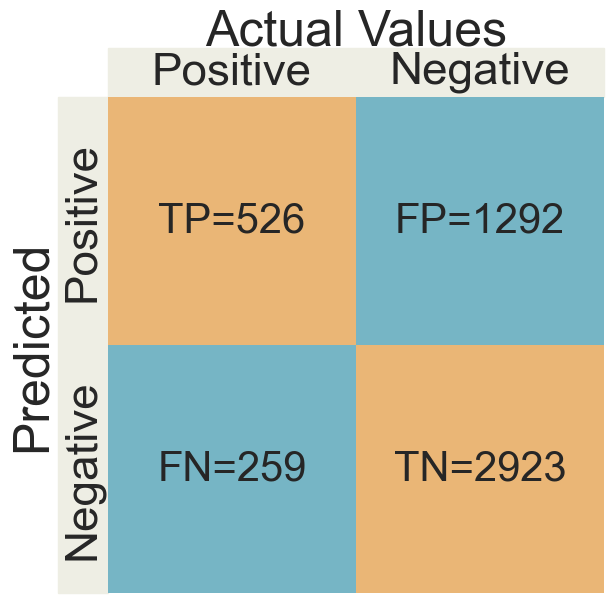

In [48]:
cm = cf_matrix
sns.set(font_scale=3)
plt.figure(figsize=(7, 7))
ax = sns.heatmap(data=[[1, 0], [0, 1]], cmap=sns.color_palette(['#76b5c5', '#eab676'], as_cmap=True),
                 annot=[[f"TP={cm[0][0]:.0f}", f"FP={cm[0][1]:.0f}"], [f"FN={cm[1][0]:.0f}", f"TN={cm[1][1]:.0f}"]],
                 fmt='', annot_kws={'fontsize': 30}, cbar=False, square=True)

ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted')
ax.tick_params(length=0, labeltop=True, labelbottom=False)
ax.xaxis.set_label_position('top')
ax.set_xticklabels(['Positive', 'Negative'])
ax.set_yticklabels(['Positive', 'Negative'], rotation=90, va='center')
ax.add_patch(plt.Rectangle((0, 1), 1, 0.1, color='#eeeee4', clip_on=False, zorder=0, transform=ax.transAxes))
ax.add_patch(plt.Rectangle((0, 0), -0.1, 1, color='#eeeee4', clip_on=False, zorder=0, transform=ax.transAxes))
plt.tight_layout()
plt.show()

In [49]:
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['Negative', 'Positive'], # Check your class names in the CSV file. It should be 1, 2, 3, 4, 5 I think
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=X_test.iloc[15],
    predict_fn=rfc.predict_proba
)

exp.show_in_notebook(show_table=True)

# **Logistic Regression**

In [50]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

In [51]:
logmodel = LogisticRegression(random_state=42)


In [52]:
params =  {
    'penalty':['l2','l1'], 'C':[1,2,3,4,5,6,7,8,9,10,11,12,15], 'max_iter':[10,15,16,17,18,19,20,21],'solver':['liblinear','newton-cg','sag','saga']
}

In [53]:
log_grid = GridSearchCV(estimator=logmodel,
                    param_grid=params,
                    cv=10,
                    n_jobs=1,
                    verbose=3)

In [54]:
log_grid.fit(X_train, y_train)

Fitting 10 folds for each of 832 candidates, totalling 8320 fits
[CV 1/10] END C=1, max_iter=10, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C=1, max_iter=10, penalty=l2, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=1, max_iter=10, penalty=l2, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=1, max_iter=10, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=1, max_iter=10, penalty=l2, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=1, max_iter=10, penalty=l2, solver=liblinear;, score=0.695 total time=   0.0s
[CV 7/10] END C=1, max_iter=10, penalty=l2, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=1, max_iter=10, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=1, max_iter=10, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=1, max_iter=10, penalty=l2, solver=liblinear;, score=0.679 total time=  

[CV 1/10] END C=1, max_iter=15, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.3s
[CV 2/10] END C=1, max_iter=15, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.3s
[CV 3/10] END C=1, max_iter=15, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.3s
[CV 4/10] END C=1, max_iter=15, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.3s
[CV 5/10] END C=1, max_iter=15, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.3s
[CV 6/10] END C=1, max_iter=15, penalty=l2, solver=newton-cg;, score=0.695 total time=   0.2s
[CV 7/10] END C=1, max_iter=15, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.2s
[CV 8/10] END C=1, max_iter=15, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.2s
[CV 9/10] END C=1, max_iter=15, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 10/10] END C=1, max_iter=15, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.1s
[CV 1/10] END C=1, max_iter=15, penalty=l2, solver=sag;, sc

[CV 1/10] END C=1, max_iter=16, penalty=l2, solver=sag;, score=0.682 total time=   0.1s
[CV 2/10] END C=1, max_iter=16, penalty=l2, solver=sag;, score=0.689 total time=   0.1s
[CV 3/10] END C=1, max_iter=16, penalty=l2, solver=sag;, score=0.679 total time=   0.1s
[CV 4/10] END C=1, max_iter=16, penalty=l2, solver=sag;, score=0.696 total time=   0.1s
[CV 5/10] END C=1, max_iter=16, penalty=l2, solver=sag;, score=0.698 total time=   0.1s
[CV 6/10] END C=1, max_iter=16, penalty=l2, solver=sag;, score=0.694 total time=   0.2s
[CV 7/10] END C=1, max_iter=16, penalty=l2, solver=sag;, score=0.708 total time=   0.2s
[CV 8/10] END C=1, max_iter=16, penalty=l2, solver=sag;, score=0.697 total time=   0.2s
[CV 9/10] END C=1, max_iter=16, penalty=l2, solver=sag;, score=0.693 total time=   0.2s
[CV 10/10] END C=1, max_iter=16, penalty=l2, solver=sag;, score=0.680 total time=   0.2s
[CV 1/10] END C=1, max_iter=16, penalty=l2, solver=saga;, score=0.683 total time=   0.3s
[CV 2/10] END C=1, max_iter=16

[CV 2/10] END C=1, max_iter=17, penalty=l2, solver=saga;, score=0.690 total time=   0.1s
[CV 3/10] END C=1, max_iter=17, penalty=l2, solver=saga;, score=0.680 total time=   0.1s
[CV 4/10] END C=1, max_iter=17, penalty=l2, solver=saga;, score=0.696 total time=   0.1s
[CV 5/10] END C=1, max_iter=17, penalty=l2, solver=saga;, score=0.701 total time=   0.1s
[CV 6/10] END C=1, max_iter=17, penalty=l2, solver=saga;, score=0.695 total time=   0.1s
[CV 7/10] END C=1, max_iter=17, penalty=l2, solver=saga;, score=0.707 total time=   0.1s
[CV 8/10] END C=1, max_iter=17, penalty=l2, solver=saga;, score=0.697 total time=   0.1s
[CV 9/10] END C=1, max_iter=17, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 10/10] END C=1, max_iter=17, penalty=l2, solver=saga;, score=0.679 total time=   0.1s
[CV 1/10] END C=1, max_iter=17, penalty=l1, solver=liblinear;, score=0.682 total time=   0.0s
[CV 2/10] END C=1, max_iter=17, penalty=l1, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] 

[CV 4/10] END C=1, max_iter=18, penalty=l1, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=1, max_iter=18, penalty=l1, solver=liblinear;, score=0.700 total time=   0.0s
[CV 6/10] END C=1, max_iter=18, penalty=l1, solver=liblinear;, score=0.695 total time=   0.0s
[CV 7/10] END C=1, max_iter=18, penalty=l1, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=1, max_iter=18, penalty=l1, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=1, max_iter=18, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=1, max_iter=18, penalty=l1, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=1, max_iter=18, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=1, max_iter=18, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 3/10] END C=1, max_iter=18, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 4/10] END C=1, max_iter=18, penalty=l1, solver=newton-cg;, sc

[CV 1/10] END C=1, max_iter=19, penalty=l1, solver=saga;, score=0.682 total time=   0.2s
[CV 2/10] END C=1, max_iter=19, penalty=l1, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=1, max_iter=19, penalty=l1, solver=saga;, score=0.680 total time=   0.2s
[CV 4/10] END C=1, max_iter=19, penalty=l1, solver=saga;, score=0.696 total time=   0.2s
[CV 5/10] END C=1, max_iter=19, penalty=l1, solver=saga;, score=0.700 total time=   0.2s
[CV 6/10] END C=1, max_iter=19, penalty=l1, solver=saga;, score=0.695 total time=   0.2s
[CV 7/10] END C=1, max_iter=19, penalty=l1, solver=saga;, score=0.707 total time=   0.2s
[CV 8/10] END C=1, max_iter=19, penalty=l1, solver=saga;, score=0.697 total time=   0.2s
[CV 9/10] END C=1, max_iter=19, penalty=l1, solver=saga;, score=0.694 total time=   0.3s
[CV 10/10] END C=1, max_iter=19, penalty=l1, solver=saga;, score=0.679 total time=   0.3s
[CV 1/10] END C=1, max_iter=20, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C

[CV 3/10] END C=1, max_iter=21, penalty=l2, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=1, max_iter=21, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=1, max_iter=21, penalty=l2, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=1, max_iter=21, penalty=l2, solver=liblinear;, score=0.695 total time=   0.0s
[CV 7/10] END C=1, max_iter=21, penalty=l2, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=1, max_iter=21, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=1, max_iter=21, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=1, max_iter=21, penalty=l2, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=1, max_iter=21, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.2s
[CV 2/10] END C=1, max_iter=21, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.2s
[CV 3/10] END C=1, max_iter=21, penalty=l2, solver=newton-c

[CV 3/10] END C=2, max_iter=10, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.0s
[CV 4/10] END C=2, max_iter=10, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.0s
[CV 5/10] END C=2, max_iter=10, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.0s
[CV 6/10] END C=2, max_iter=10, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.0s
[CV 7/10] END C=2, max_iter=10, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.0s
[CV 8/10] END C=2, max_iter=10, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.0s
[CV 9/10] END C=2, max_iter=10, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.0s
[CV 10/10] END C=2, max_iter=10, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.0s
[CV 1/10] END C=2, max_iter=10, penalty=l2, solver=sag;, score=0.679 total time=   0.0s
[CV 2/10] END C=2, max_iter=10, penalty=l2, solver=sag;, score=0.695 total time=   0.0s
[CV 3/10] END C=2, max_iter=10, penalty=l2, solver=sag;, score=0.680 to

[CV 3/10] END C=2, max_iter=15, penalty=l2, solver=sag;, score=0.680 total time=   0.1s
[CV 4/10] END C=2, max_iter=15, penalty=l2, solver=sag;, score=0.694 total time=   0.1s
[CV 5/10] END C=2, max_iter=15, penalty=l2, solver=sag;, score=0.697 total time=   0.1s
[CV 6/10] END C=2, max_iter=15, penalty=l2, solver=sag;, score=0.692 total time=   0.1s
[CV 7/10] END C=2, max_iter=15, penalty=l2, solver=sag;, score=0.702 total time=   0.1s
[CV 8/10] END C=2, max_iter=15, penalty=l2, solver=sag;, score=0.699 total time=   0.1s
[CV 9/10] END C=2, max_iter=15, penalty=l2, solver=sag;, score=0.699 total time=   0.1s
[CV 10/10] END C=2, max_iter=15, penalty=l2, solver=sag;, score=0.681 total time=   0.1s
[CV 1/10] END C=2, max_iter=15, penalty=l2, solver=saga;, score=0.682 total time=   0.1s
[CV 2/10] END C=2, max_iter=15, penalty=l2, solver=saga;, score=0.690 total time=   0.1s
[CV 3/10] END C=2, max_iter=15, penalty=l2, solver=saga;, score=0.680 total time=   0.2s
[CV 4/10] END C=2, max_iter=

[CV 5/10] END C=2, max_iter=16, penalty=l2, solver=saga;, score=0.701 total time=   0.2s
[CV 6/10] END C=2, max_iter=16, penalty=l2, solver=saga;, score=0.694 total time=   0.2s
[CV 7/10] END C=2, max_iter=16, penalty=l2, solver=saga;, score=0.707 total time=   0.2s
[CV 8/10] END C=2, max_iter=16, penalty=l2, solver=saga;, score=0.697 total time=   0.2s
[CV 9/10] END C=2, max_iter=16, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 10/10] END C=2, max_iter=16, penalty=l2, solver=saga;, score=0.679 total time=   0.2s
[CV 1/10] END C=2, max_iter=16, penalty=l1, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C=2, max_iter=16, penalty=l1, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=2, max_iter=16, penalty=l1, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=2, max_iter=16, penalty=l1, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=2, max_iter=16, penalty=l1, solver=liblinear;, score=0.700 total time=   

[CV 6/10] END C=2, max_iter=17, penalty=l1, solver=liblinear;, score=0.695 total time=   0.0s
[CV 7/10] END C=2, max_iter=17, penalty=l1, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=2, max_iter=17, penalty=l1, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=2, max_iter=17, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=2, max_iter=17, penalty=l1, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=2, max_iter=17, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=2, max_iter=17, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 3/10] END C=2, max_iter=17, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 4/10] END C=2, max_iter=17, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 5/10] END C=2, max_iter=17, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 6/10] END C=2, max_iter=17, penalty=l1, solver=newton-cg;, score=

[CV 6/10] END C=2, max_iter=18, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 7/10] END C=2, max_iter=18, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 8/10] END C=2, max_iter=18, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 9/10] END C=2, max_iter=18, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 10/10] END C=2, max_iter=18, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 1/10] END C=2, max_iter=18, penalty=l1, solver=saga;, score=0.683 total time=   0.2s
[CV 2/10] END C=2, max_iter=18, penalty=l1, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=2, max_iter=18, penalty=l1, solver=saga;, score=0.680 total time=   0.2s
[CV 4/10] END C=2, max_iter=18, penalty=l1, solver=saga;, score=0.696 total time=   0.3s
[CV 5/10] END C=2, max_iter=18, penalty=l1, solver=saga;, score=0.701 total time=   0.9s
[CV 6/10] END C=2, max_iter=18, penalty=l1, solver=saga;, score=0.694 total time=   0.8s
[CV 7/10] END C=2, max_iter=18, pen

[CV 7/10] END C=2, max_iter=19, penalty=l1, solver=saga;, score=0.707 total time=   0.2s
[CV 8/10] END C=2, max_iter=19, penalty=l1, solver=saga;, score=0.697 total time=   0.4s
[CV 9/10] END C=2, max_iter=19, penalty=l1, solver=saga;, score=0.694 total time=   0.3s
[CV 10/10] END C=2, max_iter=19, penalty=l1, solver=saga;, score=0.679 total time=   0.3s
[CV 1/10] END C=2, max_iter=20, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C=2, max_iter=20, penalty=l2, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=2, max_iter=20, penalty=l2, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=2, max_iter=20, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=2, max_iter=20, penalty=l2, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=2, max_iter=20, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=2, max_iter=20, penalty=l2, solver=liblinear;, score=0.707 tota

[CV 8/10] END C=2, max_iter=21, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=2, max_iter=21, penalty=l2, solver=liblinear;, score=0.694 total time=   0.1s
[CV 10/10] END C=2, max_iter=21, penalty=l2, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=2, max_iter=21, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.1s
[CV 2/10] END C=2, max_iter=21, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.1s
[CV 3/10] END C=2, max_iter=21, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.0s
[CV 4/10] END C=2, max_iter=21, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.1s
[CV 5/10] END C=2, max_iter=21, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.1s
[CV 6/10] END C=2, max_iter=21, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 7/10] END C=2, max_iter=21, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.1s
[CV 8/10] END C=2, max_iter=21, penalty=l2, solver=newton-c

[CV 9/10] END C=3, max_iter=10, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.0s
[CV 10/10] END C=3, max_iter=10, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.0s
[CV 1/10] END C=3, max_iter=10, penalty=l2, solver=sag;, score=0.684 total time=   0.0s
[CV 2/10] END C=3, max_iter=10, penalty=l2, solver=sag;, score=0.701 total time=   0.0s
[CV 3/10] END C=3, max_iter=10, penalty=l2, solver=sag;, score=0.681 total time=   0.1s
[CV 4/10] END C=3, max_iter=10, penalty=l2, solver=sag;, score=0.689 total time=   0.0s
[CV 5/10] END C=3, max_iter=10, penalty=l2, solver=sag;, score=0.689 total time=   0.1s
[CV 6/10] END C=3, max_iter=10, penalty=l2, solver=sag;, score=0.681 total time=   0.0s
[CV 7/10] END C=3, max_iter=10, penalty=l2, solver=sag;, score=0.703 total time=   0.1s
[CV 8/10] END C=3, max_iter=10, penalty=l2, solver=sag;, score=0.696 total time=   0.1s
[CV 9/10] END C=3, max_iter=10, penalty=l2, solver=sag;, score=0.694 total time=   0.1s
[CV 10/10] END C=3,

[CV 10/10] END C=3, max_iter=15, penalty=l2, solver=sag;, score=0.678 total time=   0.1s
[CV 1/10] END C=3, max_iter=15, penalty=l2, solver=saga;, score=0.682 total time=   0.1s
[CV 2/10] END C=3, max_iter=15, penalty=l2, solver=saga;, score=0.690 total time=   0.1s
[CV 3/10] END C=3, max_iter=15, penalty=l2, solver=saga;, score=0.680 total time=   0.1s
[CV 4/10] END C=3, max_iter=15, penalty=l2, solver=saga;, score=0.696 total time=   0.1s
[CV 5/10] END C=3, max_iter=15, penalty=l2, solver=saga;, score=0.701 total time=   0.1s
[CV 6/10] END C=3, max_iter=15, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 7/10] END C=3, max_iter=15, penalty=l2, solver=saga;, score=0.707 total time=   0.1s
[CV 8/10] END C=3, max_iter=15, penalty=l2, solver=saga;, score=0.697 total time=   0.1s
[CV 9/10] END C=3, max_iter=15, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 10/10] END C=3, max_iter=15, penalty=l2, solver=saga;, score=0.679 total time=   0.1s
[CV 1/10] END C=3, m

[CV 2/10] END C=3, max_iter=16, penalty=l1, solver=liblinear;, score=0.690 total time=   0.1s
[CV 3/10] END C=3, max_iter=16, penalty=l1, solver=liblinear;, score=0.680 total time=   0.1s
[CV 4/10] END C=3, max_iter=16, penalty=l1, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=3, max_iter=16, penalty=l1, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=3, max_iter=16, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=3, max_iter=16, penalty=l1, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=3, max_iter=16, penalty=l1, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=3, max_iter=16, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=3, max_iter=16, penalty=l1, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=3, max_iter=16, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=3, max_iter=16, penalty=l1, solver=newton-cg;

[CV 8/10] END C=3, max_iter=17, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 9/10] END C=3, max_iter=17, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 10/10] END C=3, max_iter=17, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 1/10] END C=3, max_iter=17, penalty=l1, solver=saga;, score=0.683 total time=   0.1s
[CV 2/10] END C=3, max_iter=17, penalty=l1, solver=saga;, score=0.690 total time=   0.1s
[CV 3/10] END C=3, max_iter=17, penalty=l1, solver=saga;, score=0.680 total time=   0.1s
[CV 4/10] END C=3, max_iter=17, penalty=l1, solver=saga;, score=0.696 total time=   0.2s
[CV 5/10] END C=3, max_iter=17, penalty=l1, solver=saga;, score=0.701 total time=   0.2s
[CV 6/10] END C=3, max_iter=17, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 7/10] END C=3, max_iter=17, penalty=l1, solver=saga;, score=0.707 total time=   0.1s
[CV 8/10] END C=3, max_iter=17, penalty=l1, solver=saga;, score=0.697 total time=   0.1s
[CV 9/10] END C=3, max_iter=1

[CV 9/10] END C=3, max_iter=18, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 10/10] END C=3, max_iter=18, penalty=l1, solver=saga;, score=0.679 total time=   0.2s
[CV 1/10] END C=3, max_iter=19, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C=3, max_iter=19, penalty=l2, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=3, max_iter=19, penalty=l2, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=3, max_iter=19, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=3, max_iter=19, penalty=l2, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=3, max_iter=19, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=3, max_iter=19, penalty=l2, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=3, max_iter=19, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=3, max_iter=19, penalty=l2, solver=liblinear;, score=

[CV 10/10] END C=3, max_iter=20, penalty=l2, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=3, max_iter=20, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.3s
[CV 2/10] END C=3, max_iter=20, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.2s
[CV 3/10] END C=3, max_iter=20, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.1s
[CV 4/10] END C=3, max_iter=20, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.2s
[CV 5/10] END C=3, max_iter=20, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.1s
[CV 6/10] END C=3, max_iter=20, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 7/10] END C=3, max_iter=20, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.1s
[CV 8/10] END C=3, max_iter=20, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.1s
[CV 9/10] END C=3, max_iter=20, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.0s
[CV 10/10] END C=3, max_iter=20, penalty=l2, solver=newton-

[CV 10/10] END C=3, max_iter=21, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.1s
[CV 1/10] END C=3, max_iter=21, penalty=l2, solver=sag;, score=0.681 total time=   0.2s
[CV 2/10] END C=3, max_iter=21, penalty=l2, solver=sag;, score=0.688 total time=   0.2s
[CV 3/10] END C=3, max_iter=21, penalty=l2, solver=sag;, score=0.682 total time=   0.2s
[CV 4/10] END C=3, max_iter=21, penalty=l2, solver=sag;, score=0.697 total time=   0.2s
[CV 5/10] END C=3, max_iter=21, penalty=l2, solver=sag;, score=0.700 total time=   0.2s
[CV 6/10] END C=3, max_iter=21, penalty=l2, solver=sag;, score=0.695 total time=   0.2s
[CV 7/10] END C=3, max_iter=21, penalty=l2, solver=sag;, score=0.706 total time=   0.2s
[CV 8/10] END C=3, max_iter=21, penalty=l2, solver=sag;, score=0.697 total time=   0.2s
[CV 9/10] END C=3, max_iter=21, penalty=l2, solver=sag;, score=0.692 total time=   0.3s
[CV 10/10] END C=3, max_iter=21, penalty=l2, solver=sag;, score=0.677 total time=   0.2s
[CV 1/10] END C=3, max_i

[CV 1/10] END C=4, max_iter=10, penalty=l2, solver=saga;, score=0.682 total time=   0.0s
[CV 2/10] END C=4, max_iter=10, penalty=l2, solver=saga;, score=0.691 total time=   0.0s
[CV 3/10] END C=4, max_iter=10, penalty=l2, solver=saga;, score=0.679 total time=   0.1s
[CV 4/10] END C=4, max_iter=10, penalty=l2, solver=saga;, score=0.696 total time=   0.1s
[CV 5/10] END C=4, max_iter=10, penalty=l2, solver=saga;, score=0.699 total time=   0.1s
[CV 6/10] END C=4, max_iter=10, penalty=l2, solver=saga;, score=0.695 total time=   0.1s
[CV 7/10] END C=4, max_iter=10, penalty=l2, solver=saga;, score=0.707 total time=   0.1s
[CV 8/10] END C=4, max_iter=10, penalty=l2, solver=saga;, score=0.697 total time=   0.1s
[CV 9/10] END C=4, max_iter=10, penalty=l2, solver=saga;, score=0.692 total time=   0.1s
[CV 10/10] END C=4, max_iter=10, penalty=l2, solver=saga;, score=0.682 total time=   0.1s
[CV 1/10] END C=4, max_iter=10, penalty=l1, solver=liblinear;, score=0.682 total time=   0.0s
[CV 2/10] END C

[CV 3/10] END C=4, max_iter=15, penalty=l1, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=4, max_iter=15, penalty=l1, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=4, max_iter=15, penalty=l1, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=4, max_iter=15, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=4, max_iter=15, penalty=l1, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=4, max_iter=15, penalty=l1, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=4, max_iter=15, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=4, max_iter=15, penalty=l1, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=4, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=4, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 3/10] END C=4, max_iter=15, penalty=l1, solver=newton-cg;, 

[CV 2/10] END C=4, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 3/10] END C=4, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 4/10] END C=4, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 5/10] END C=4, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 6/10] END C=4, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 7/10] END C=4, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 8/10] END C=4, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 9/10] END C=4, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 10/10] END C=4, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 1/10] END C=4, max_iter=16, penalty=l1, solver=saga;, score=0.683 total time=   0.2s
[CV 2/10] END C=4, max_iter=16, penalty=l1, solver=saga;, score=0.690 total time=   0.4s
[CV 3/10] END C=4, max_iter=16, penalty=l1, sol

[CV 3/10] END C=4, max_iter=17, penalty=l1, solver=saga;, score=0.680 total time=   0.2s
[CV 4/10] END C=4, max_iter=17, penalty=l1, solver=saga;, score=0.696 total time=   0.1s
[CV 5/10] END C=4, max_iter=17, penalty=l1, solver=saga;, score=0.701 total time=   0.1s
[CV 6/10] END C=4, max_iter=17, penalty=l1, solver=saga;, score=0.694 total time=   0.1s
[CV 7/10] END C=4, max_iter=17, penalty=l1, solver=saga;, score=0.707 total time=   0.1s
[CV 8/10] END C=4, max_iter=17, penalty=l1, solver=saga;, score=0.697 total time=   0.1s
[CV 9/10] END C=4, max_iter=17, penalty=l1, solver=saga;, score=0.694 total time=   0.1s
[CV 10/10] END C=4, max_iter=17, penalty=l1, solver=saga;, score=0.679 total time=   0.2s
[CV 1/10] END C=4, max_iter=18, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C=4, max_iter=18, penalty=l2, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=4, max_iter=18, penalty=l2, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4

[CV 4/10] END C=4, max_iter=19, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=4, max_iter=19, penalty=l2, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=4, max_iter=19, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=4, max_iter=19, penalty=l2, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=4, max_iter=19, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=4, max_iter=19, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=4, max_iter=19, penalty=l2, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=4, max_iter=19, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.1s
[CV 2/10] END C=4, max_iter=19, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.1s
[CV 3/10] END C=4, max_iter=19, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.1s
[CV 4/10] END C=4, max_iter=19, penalty=l2, solver=newton-c

[CV 4/10] END C=4, max_iter=20, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.1s
[CV 5/10] END C=4, max_iter=20, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.1s
[CV 6/10] END C=4, max_iter=20, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 7/10] END C=4, max_iter=20, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.1s
[CV 8/10] END C=4, max_iter=20, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.1s
[CV 9/10] END C=4, max_iter=20, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 10/10] END C=4, max_iter=20, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.1s
[CV 1/10] END C=4, max_iter=20, penalty=l2, solver=sag;, score=0.682 total time=   0.1s
[CV 2/10] END C=4, max_iter=20, penalty=l2, solver=sag;, score=0.689 total time=   0.1s
[CV 3/10] END C=4, max_iter=20, penalty=l2, solver=sag;, score=0.682 total time=   0.1s
[CV 4/10] END C=4, max_iter=20, penalty=l2, solver=sag;, score=0.697 total ti

[CV 5/10] END C=4, max_iter=21, penalty=l2, solver=sag;, score=0.700 total time=   0.2s
[CV 6/10] END C=4, max_iter=21, penalty=l2, solver=sag;, score=0.696 total time=   0.2s
[CV 7/10] END C=4, max_iter=21, penalty=l2, solver=sag;, score=0.707 total time=   0.2s
[CV 8/10] END C=4, max_iter=21, penalty=l2, solver=sag;, score=0.698 total time=   0.2s
[CV 9/10] END C=4, max_iter=21, penalty=l2, solver=sag;, score=0.693 total time=   0.2s
[CV 10/10] END C=4, max_iter=21, penalty=l2, solver=sag;, score=0.677 total time=   0.2s
[CV 1/10] END C=4, max_iter=21, penalty=l2, solver=saga;, score=0.683 total time=   0.1s
[CV 2/10] END C=4, max_iter=21, penalty=l2, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=4, max_iter=21, penalty=l2, solver=saga;, score=0.680 total time=   0.2s
[CV 4/10] END C=4, max_iter=21, penalty=l2, solver=saga;, score=0.696 total time=   0.2s
[CV 5/10] END C=4, max_iter=21, penalty=l2, solver=saga;, score=0.701 total time=   0.1s
[CV 6/10] END C=4, max_ite

[CV 7/10] END C=5, max_iter=10, penalty=l2, solver=saga;, score=0.707 total time=   0.0s
[CV 8/10] END C=5, max_iter=10, penalty=l2, solver=saga;, score=0.697 total time=   0.0s
[CV 9/10] END C=5, max_iter=10, penalty=l2, solver=saga;, score=0.692 total time=   0.0s
[CV 10/10] END C=5, max_iter=10, penalty=l2, solver=saga;, score=0.682 total time=   0.0s
[CV 1/10] END C=5, max_iter=10, penalty=l1, solver=liblinear;, score=0.682 total time=   0.0s
[CV 2/10] END C=5, max_iter=10, penalty=l1, solver=liblinear;, score=0.691 total time=   0.0s
[CV 3/10] END C=5, max_iter=10, penalty=l1, solver=liblinear;, score=0.681 total time=   0.0s
[CV 4/10] END C=5, max_iter=10, penalty=l1, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=5, max_iter=10, penalty=l1, solver=liblinear;, score=0.700 total time=   0.0s
[CV 6/10] END C=5, max_iter=10, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=5, max_iter=10, penalty=l1, solver=liblinear;, score=0.708 tota

[CV 9/10] END C=5, max_iter=15, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=5, max_iter=15, penalty=l1, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=5, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=5, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 3/10] END C=5, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 4/10] END C=5, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 5/10] END C=5, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 6/10] END C=5, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 7/10] END C=5, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 8/10] END C=5, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 9/10] END C=5, max_iter=15, penalty=l1, solver=newton-cg;, score=nan to

[CV 10/10] END C=5, max_iter=16, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 1/10] END C=5, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 2/10] END C=5, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 3/10] END C=5, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 4/10] END C=5, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 5/10] END C=5, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 6/10] END C=5, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 7/10] END C=5, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 8/10] END C=5, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 9/10] END C=5, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 10/10] END C=5, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 1/10] END C=5, max_iter=16, penalty=l1, so

[CV 1/10] END C=5, max_iter=17, penalty=l1, solver=saga;, score=0.683 total time=   0.3s
[CV 2/10] END C=5, max_iter=17, penalty=l1, solver=saga;, score=0.690 total time=   0.3s
[CV 3/10] END C=5, max_iter=17, penalty=l1, solver=saga;, score=0.680 total time=   0.3s
[CV 4/10] END C=5, max_iter=17, penalty=l1, solver=saga;, score=0.696 total time=   0.3s
[CV 5/10] END C=5, max_iter=17, penalty=l1, solver=saga;, score=0.701 total time=   0.4s
[CV 6/10] END C=5, max_iter=17, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 7/10] END C=5, max_iter=17, penalty=l1, solver=saga;, score=0.707 total time=   0.2s
[CV 8/10] END C=5, max_iter=17, penalty=l1, solver=saga;, score=0.697 total time=   0.2s
[CV 9/10] END C=5, max_iter=17, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 10/10] END C=5, max_iter=17, penalty=l1, solver=saga;, score=0.679 total time=   0.2s
[CV 1/10] END C=5, max_iter=18, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C

[CV 2/10] END C=5, max_iter=19, penalty=l2, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=5, max_iter=19, penalty=l2, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=5, max_iter=19, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=5, max_iter=19, penalty=l2, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=5, max_iter=19, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=5, max_iter=19, penalty=l2, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=5, max_iter=19, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=5, max_iter=19, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=5, max_iter=19, penalty=l2, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=5, max_iter=19, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.2s
[CV 2/10] END C=5, max_iter=19, penalty=l2, solver=newton-c

[CV 3/10] END C=5, max_iter=20, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.1s
[CV 4/10] END C=5, max_iter=20, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.1s
[CV 5/10] END C=5, max_iter=20, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.1s
[CV 6/10] END C=5, max_iter=20, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 7/10] END C=5, max_iter=20, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.1s
[CV 8/10] END C=5, max_iter=20, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.1s
[CV 9/10] END C=5, max_iter=20, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.0s
[CV 10/10] END C=5, max_iter=20, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.1s
[CV 1/10] END C=5, max_iter=20, penalty=l2, solver=sag;, score=0.683 total time=   0.1s
[CV 2/10] END C=5, max_iter=20, penalty=l2, solver=sag;, score=0.689 total time=   0.1s
[CV 3/10] END C=5, max_iter=20, penalty=l2, solver=sag;, score=0.682 to

[CV 3/10] END C=5, max_iter=21, penalty=l2, solver=sag;, score=0.681 total time=   0.2s
[CV 4/10] END C=5, max_iter=21, penalty=l2, solver=sag;, score=0.695 total time=   0.2s
[CV 5/10] END C=5, max_iter=21, penalty=l2, solver=sag;, score=0.700 total time=   0.1s
[CV 6/10] END C=5, max_iter=21, penalty=l2, solver=sag;, score=0.694 total time=   0.2s
[CV 7/10] END C=5, max_iter=21, penalty=l2, solver=sag;, score=0.707 total time=   0.1s
[CV 8/10] END C=5, max_iter=21, penalty=l2, solver=sag;, score=0.698 total time=   0.1s
[CV 9/10] END C=5, max_iter=21, penalty=l2, solver=sag;, score=0.694 total time=   0.1s
[CV 10/10] END C=5, max_iter=21, penalty=l2, solver=sag;, score=0.677 total time=   0.1s
[CV 1/10] END C=5, max_iter=21, penalty=l2, solver=saga;, score=0.683 total time=   0.1s
[CV 2/10] END C=5, max_iter=21, penalty=l2, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=5, max_iter=21, penalty=l2, solver=saga;, score=0.680 total time=   0.1s
[CV 4/10] END C=5, max_iter=

[CV 5/10] END C=6, max_iter=10, penalty=l2, solver=saga;, score=0.699 total time=   0.1s
[CV 6/10] END C=6, max_iter=10, penalty=l2, solver=saga;, score=0.695 total time=   0.2s
[CV 7/10] END C=6, max_iter=10, penalty=l2, solver=saga;, score=0.707 total time=   0.1s
[CV 8/10] END C=6, max_iter=10, penalty=l2, solver=saga;, score=0.697 total time=   0.1s
[CV 9/10] END C=6, max_iter=10, penalty=l2, solver=saga;, score=0.692 total time=   0.1s
[CV 10/10] END C=6, max_iter=10, penalty=l2, solver=saga;, score=0.682 total time=   0.1s
[CV 1/10] END C=6, max_iter=10, penalty=l1, solver=liblinear;, score=0.682 total time=   0.0s
[CV 2/10] END C=6, max_iter=10, penalty=l1, solver=liblinear;, score=0.691 total time=   0.0s
[CV 3/10] END C=6, max_iter=10, penalty=l1, solver=liblinear;, score=0.681 total time=   0.0s
[CV 4/10] END C=6, max_iter=10, penalty=l1, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=6, max_iter=10, penalty=l1, solver=liblinear;, score=0.700 total time=   

[CV 7/10] END C=6, max_iter=15, penalty=l1, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=6, max_iter=15, penalty=l1, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=6, max_iter=15, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=6, max_iter=15, penalty=l1, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=6, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=6, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 3/10] END C=6, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 4/10] END C=6, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 5/10] END C=6, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 6/10] END C=6, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 7/10] END C=6, max_iter=15, penalty=l1, solver=newton-cg;, score=na

[CV 1/10] END C=6, max_iter=16, penalty=l1, solver=saga;, score=0.683 total time=   0.1s
[CV 2/10] END C=6, max_iter=16, penalty=l1, solver=saga;, score=0.690 total time=   0.1s
[CV 3/10] END C=6, max_iter=16, penalty=l1, solver=saga;, score=0.680 total time=   0.4s
[CV 4/10] END C=6, max_iter=16, penalty=l1, solver=saga;, score=0.696 total time=   0.3s
[CV 5/10] END C=6, max_iter=16, penalty=l1, solver=saga;, score=0.701 total time=   0.2s
[CV 6/10] END C=6, max_iter=16, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 7/10] END C=6, max_iter=16, penalty=l1, solver=saga;, score=0.707 total time=   0.4s
[CV 8/10] END C=6, max_iter=16, penalty=l1, solver=saga;, score=0.697 total time=   0.4s
[CV 9/10] END C=6, max_iter=16, penalty=l1, solver=saga;, score=0.694 total time=   0.1s
[CV 10/10] END C=6, max_iter=16, penalty=l1, solver=saga;, score=0.679 total time=   0.1s
[CV 1/10] END C=6, max_iter=17, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C

[CV 2/10] END C=6, max_iter=18, penalty=l2, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=6, max_iter=18, penalty=l2, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=6, max_iter=18, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=6, max_iter=18, penalty=l2, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=6, max_iter=18, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=6, max_iter=18, penalty=l2, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=6, max_iter=18, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=6, max_iter=18, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=6, max_iter=18, penalty=l2, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=6, max_iter=18, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.1s
[CV 2/10] END C=6, max_iter=18, penalty=l2, solver=newton-c

[CV 3/10] END C=6, max_iter=19, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.0s
[CV 4/10] END C=6, max_iter=19, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.0s
[CV 5/10] END C=6, max_iter=19, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.1s
[CV 6/10] END C=6, max_iter=19, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 7/10] END C=6, max_iter=19, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.1s
[CV 8/10] END C=6, max_iter=19, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.1s
[CV 9/10] END C=6, max_iter=19, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.0s
[CV 10/10] END C=6, max_iter=19, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.1s
[CV 1/10] END C=6, max_iter=19, penalty=l2, solver=sag;, score=0.680 total time=   0.1s
[CV 2/10] END C=6, max_iter=19, penalty=l2, solver=sag;, score=0.688 total time=   0.2s
[CV 3/10] END C=6, max_iter=19, penalty=l2, solver=sag;, score=0.681 to

[CV 3/10] END C=6, max_iter=20, penalty=l2, solver=sag;, score=0.682 total time=   0.1s
[CV 4/10] END C=6, max_iter=20, penalty=l2, solver=sag;, score=0.697 total time=   0.1s
[CV 5/10] END C=6, max_iter=20, penalty=l2, solver=sag;, score=0.699 total time=   0.1s
[CV 6/10] END C=6, max_iter=20, penalty=l2, solver=sag;, score=0.694 total time=   0.3s
[CV 7/10] END C=6, max_iter=20, penalty=l2, solver=sag;, score=0.706 total time=   0.1s
[CV 8/10] END C=6, max_iter=20, penalty=l2, solver=sag;, score=0.697 total time=   0.3s
[CV 9/10] END C=6, max_iter=20, penalty=l2, solver=sag;, score=0.692 total time=   0.3s
[CV 10/10] END C=6, max_iter=20, penalty=l2, solver=sag;, score=0.678 total time=   0.2s
[CV 1/10] END C=6, max_iter=20, penalty=l2, solver=saga;, score=0.683 total time=   0.2s
[CV 2/10] END C=6, max_iter=20, penalty=l2, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=6, max_iter=20, penalty=l2, solver=saga;, score=0.680 total time=   0.2s
[CV 4/10] END C=6, max_iter=

[CV 4/10] END C=6, max_iter=21, penalty=l2, solver=saga;, score=0.696 total time=   0.1s
[CV 5/10] END C=6, max_iter=21, penalty=l2, solver=saga;, score=0.701 total time=   0.2s
[CV 6/10] END C=6, max_iter=21, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 7/10] END C=6, max_iter=21, penalty=l2, solver=saga;, score=0.707 total time=   0.1s
[CV 8/10] END C=6, max_iter=21, penalty=l2, solver=saga;, score=0.697 total time=   0.1s
[CV 9/10] END C=6, max_iter=21, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 10/10] END C=6, max_iter=21, penalty=l2, solver=saga;, score=0.679 total time=   0.1s
[CV 1/10] END C=6, max_iter=21, penalty=l1, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C=6, max_iter=21, penalty=l1, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=6, max_iter=21, penalty=l1, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=6, max_iter=21, penalty=l1, solver=liblinear;, score=0.696 total time=   0.0s


[CV 6/10] END C=7, max_iter=10, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=7, max_iter=10, penalty=l1, solver=liblinear;, score=0.708 total time=   0.0s
[CV 8/10] END C=7, max_iter=10, penalty=l1, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=7, max_iter=10, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=7, max_iter=10, penalty=l1, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=7, max_iter=10, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=7, max_iter=10, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 3/10] END C=7, max_iter=10, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 4/10] END C=7, max_iter=10, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 5/10] END C=7, max_iter=10, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 6/10] END C=7, max_iter=10, penalty=l1, solver=newton-cg;, score=

[CV 4/10] END C=7, max_iter=15, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 5/10] END C=7, max_iter=15, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 6/10] END C=7, max_iter=15, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 7/10] END C=7, max_iter=15, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 8/10] END C=7, max_iter=15, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 9/10] END C=7, max_iter=15, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 10/10] END C=7, max_iter=15, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 1/10] END C=7, max_iter=15, penalty=l1, solver=saga;, score=0.680 total time=   0.1s
[CV 2/10] END C=7, max_iter=15, penalty=l1, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=7, max_iter=15, penalty=l1, solver=saga;, score=0.681 total time=   0.2s
[CV 4/10] END C=7, max_iter=15, penalty=l1, solver=saga;, score=0.696 total time=   0.1s
[CV 5/10] END C=7, max_iter=15, penalty=l

[CV 5/10] END C=7, max_iter=16, penalty=l1, solver=saga;, score=0.701 total time=   0.2s
[CV 6/10] END C=7, max_iter=16, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 7/10] END C=7, max_iter=16, penalty=l1, solver=saga;, score=0.707 total time=   0.2s
[CV 8/10] END C=7, max_iter=16, penalty=l1, solver=saga;, score=0.697 total time=   0.2s
[CV 9/10] END C=7, max_iter=16, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 10/10] END C=7, max_iter=16, penalty=l1, solver=saga;, score=0.679 total time=   0.3s
[CV 1/10] END C=7, max_iter=17, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C=7, max_iter=17, penalty=l2, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=7, max_iter=17, penalty=l2, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=7, max_iter=17, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=7, max_iter=17, penalty=l2, solver=liblinear;, score=0.701 total time=   

[CV 9/10] END C=7, max_iter=18, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=7, max_iter=18, penalty=l2, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=7, max_iter=18, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.3s
[CV 2/10] END C=7, max_iter=18, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.2s
[CV 3/10] END C=7, max_iter=18, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.4s
[CV 4/10] END C=7, max_iter=18, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.1s
[CV 5/10] END C=7, max_iter=18, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.1s
[CV 6/10] END C=7, max_iter=18, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 7/10] END C=7, max_iter=18, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.1s
[CV 8/10] END C=7, max_iter=18, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.1s
[CV 9/10] END C=7, max_iter=18, penalty=l2, solver=newton-c

[CV 9/10] END C=7, max_iter=19, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.2s
[CV 10/10] END C=7, max_iter=19, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.3s
[CV 1/10] END C=7, max_iter=19, penalty=l2, solver=sag;, score=0.682 total time=   0.2s
[CV 2/10] END C=7, max_iter=19, penalty=l2, solver=sag;, score=0.688 total time=   0.2s
[CV 3/10] END C=7, max_iter=19, penalty=l2, solver=sag;, score=0.682 total time=   0.3s
[CV 4/10] END C=7, max_iter=19, penalty=l2, solver=sag;, score=0.694 total time=   0.3s
[CV 5/10] END C=7, max_iter=19, penalty=l2, solver=sag;, score=0.699 total time=   0.2s
[CV 6/10] END C=7, max_iter=19, penalty=l2, solver=sag;, score=0.693 total time=   0.3s
[CV 7/10] END C=7, max_iter=19, penalty=l2, solver=sag;, score=0.706 total time=   0.2s
[CV 8/10] END C=7, max_iter=19, penalty=l2, solver=sag;, score=0.698 total time=   0.2s
[CV 9/10] END C=7, max_iter=19, penalty=l2, solver=sag;, score=0.694 total time=   0.1s
[CV 10/10] END C=7,

[CV 10/10] END C=7, max_iter=20, penalty=l2, solver=sag;, score=0.678 total time=   0.2s
[CV 1/10] END C=7, max_iter=20, penalty=l2, solver=saga;, score=0.683 total time=   0.2s
[CV 2/10] END C=7, max_iter=20, penalty=l2, solver=saga;, score=0.690 total time=   0.3s
[CV 3/10] END C=7, max_iter=20, penalty=l2, solver=saga;, score=0.680 total time=   0.2s
[CV 4/10] END C=7, max_iter=20, penalty=l2, solver=saga;, score=0.696 total time=   0.2s
[CV 5/10] END C=7, max_iter=20, penalty=l2, solver=saga;, score=0.701 total time=   0.3s
[CV 6/10] END C=7, max_iter=20, penalty=l2, solver=saga;, score=0.694 total time=   0.2s
[CV 7/10] END C=7, max_iter=20, penalty=l2, solver=saga;, score=0.707 total time=   0.3s
[CV 8/10] END C=7, max_iter=20, penalty=l2, solver=saga;, score=0.697 total time=   0.2s
[CV 9/10] END C=7, max_iter=20, penalty=l2, solver=saga;, score=0.694 total time=   0.2s
[CV 10/10] END C=7, max_iter=20, penalty=l2, solver=saga;, score=0.679 total time=   0.2s
[CV 1/10] END C=7, m

[CV 2/10] END C=7, max_iter=21, penalty=l1, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=7, max_iter=21, penalty=l1, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=7, max_iter=21, penalty=l1, solver=liblinear;, score=0.696 total time=   0.1s
[CV 5/10] END C=7, max_iter=21, penalty=l1, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=7, max_iter=21, penalty=l1, solver=liblinear;, score=0.694 total time=   0.2s
[CV 7/10] END C=7, max_iter=21, penalty=l1, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=7, max_iter=21, penalty=l1, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=7, max_iter=21, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=7, max_iter=21, penalty=l1, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=7, max_iter=21, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=7, max_iter=21, penalty=l1, solver=newton-cg;

[CV 1/10] END C=8, max_iter=10, penalty=l1, solver=saga;, score=0.680 total time=   0.1s
[CV 2/10] END C=8, max_iter=10, penalty=l1, solver=saga;, score=0.691 total time=   0.1s
[CV 3/10] END C=8, max_iter=10, penalty=l1, solver=saga;, score=0.680 total time=   0.1s
[CV 4/10] END C=8, max_iter=10, penalty=l1, solver=saga;, score=0.695 total time=   0.2s
[CV 5/10] END C=8, max_iter=10, penalty=l1, solver=saga;, score=0.699 total time=   0.1s
[CV 6/10] END C=8, max_iter=10, penalty=l1, solver=saga;, score=0.695 total time=   0.1s
[CV 7/10] END C=8, max_iter=10, penalty=l1, solver=saga;, score=0.707 total time=   0.1s
[CV 8/10] END C=8, max_iter=10, penalty=l1, solver=saga;, score=0.697 total time=   0.1s
[CV 9/10] END C=8, max_iter=10, penalty=l1, solver=saga;, score=0.693 total time=   0.1s
[CV 10/10] END C=8, max_iter=10, penalty=l1, solver=saga;, score=0.682 total time=   0.1s
[CV 1/10] END C=8, max_iter=15, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C

[CV 4/10] END C=8, max_iter=16, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=8, max_iter=16, penalty=l2, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=8, max_iter=16, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=8, max_iter=16, penalty=l2, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=8, max_iter=16, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=8, max_iter=16, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=8, max_iter=16, penalty=l2, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=8, max_iter=16, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.1s
[CV 2/10] END C=8, max_iter=16, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.1s
[CV 3/10] END C=8, max_iter=16, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.1s
[CV 4/10] END C=8, max_iter=16, penalty=l2, solver=newton-c

[CV 4/10] END C=8, max_iter=17, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.1s
[CV 5/10] END C=8, max_iter=17, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.1s
[CV 6/10] END C=8, max_iter=17, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 7/10] END C=8, max_iter=17, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.1s
[CV 8/10] END C=8, max_iter=17, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.1s
[CV 9/10] END C=8, max_iter=17, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 10/10] END C=8, max_iter=17, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.1s
[CV 1/10] END C=8, max_iter=17, penalty=l2, solver=sag;, score=0.683 total time=   0.1s
[CV 2/10] END C=8, max_iter=17, penalty=l2, solver=sag;, score=0.689 total time=   0.2s
[CV 3/10] END C=8, max_iter=17, penalty=l2, solver=sag;, score=0.678 total time=   0.2s
[CV 4/10] END C=8, max_iter=17, penalty=l2, solver=sag;, score=0.699 total ti

[CV 5/10] END C=8, max_iter=18, penalty=l2, solver=sag;, score=0.699 total time=   0.1s
[CV 6/10] END C=8, max_iter=18, penalty=l2, solver=sag;, score=0.692 total time=   0.1s
[CV 7/10] END C=8, max_iter=18, penalty=l2, solver=sag;, score=0.706 total time=   0.1s
[CV 8/10] END C=8, max_iter=18, penalty=l2, solver=sag;, score=0.697 total time=   0.1s
[CV 9/10] END C=8, max_iter=18, penalty=l2, solver=sag;, score=0.692 total time=   0.1s
[CV 10/10] END C=8, max_iter=18, penalty=l2, solver=sag;, score=0.678 total time=   0.1s
[CV 1/10] END C=8, max_iter=18, penalty=l2, solver=saga;, score=0.683 total time=   0.1s
[CV 2/10] END C=8, max_iter=18, penalty=l2, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=8, max_iter=18, penalty=l2, solver=saga;, score=0.680 total time=   0.1s
[CV 4/10] END C=8, max_iter=18, penalty=l2, solver=saga;, score=0.696 total time=   0.1s
[CV 5/10] END C=8, max_iter=18, penalty=l2, solver=saga;, score=0.701 total time=   0.1s
[CV 6/10] END C=8, max_ite

[CV 6/10] END C=8, max_iter=19, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 7/10] END C=8, max_iter=19, penalty=l2, solver=saga;, score=0.707 total time=   0.1s
[CV 8/10] END C=8, max_iter=19, penalty=l2, solver=saga;, score=0.697 total time=   0.1s
[CV 9/10] END C=8, max_iter=19, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 10/10] END C=8, max_iter=19, penalty=l2, solver=saga;, score=0.679 total time=   0.1s
[CV 1/10] END C=8, max_iter=19, penalty=l1, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C=8, max_iter=19, penalty=l1, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=8, max_iter=19, penalty=l1, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=8, max_iter=19, penalty=l1, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=8, max_iter=19, penalty=l1, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=8, max_iter=19, penalty=l1, solver=liblinear;, score=0.694 total tim

[CV 9/10] END C=8, max_iter=20, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=8, max_iter=20, penalty=l1, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=8, max_iter=20, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=8, max_iter=20, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 3/10] END C=8, max_iter=20, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 4/10] END C=8, max_iter=20, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 5/10] END C=8, max_iter=20, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 6/10] END C=8, max_iter=20, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 7/10] END C=8, max_iter=20, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 8/10] END C=8, max_iter=20, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 9/10] END C=8, max_iter=20, penalty=l1, solver=newton-cg;, score=nan to

[CV 1/10] END C=8, max_iter=21, penalty=l1, solver=saga;, score=0.683 total time=   0.2s
[CV 2/10] END C=8, max_iter=21, penalty=l1, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=8, max_iter=21, penalty=l1, solver=saga;, score=0.680 total time=   0.2s
[CV 4/10] END C=8, max_iter=21, penalty=l1, solver=saga;, score=0.696 total time=   0.3s
[CV 5/10] END C=8, max_iter=21, penalty=l1, solver=saga;, score=0.701 total time=   0.3s
[CV 6/10] END C=8, max_iter=21, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 7/10] END C=8, max_iter=21, penalty=l1, solver=saga;, score=0.707 total time=   0.3s
[CV 8/10] END C=8, max_iter=21, penalty=l1, solver=saga;, score=0.697 total time=   0.3s
[CV 9/10] END C=8, max_iter=21, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 10/10] END C=8, max_iter=21, penalty=l1, solver=saga;, score=0.679 total time=   0.3s
[CV 1/10] END C=9, max_iter=10, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C

[CV 5/10] END C=9, max_iter=15, penalty=l2, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=9, max_iter=15, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=9, max_iter=15, penalty=l2, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=9, max_iter=15, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=9, max_iter=15, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=9, max_iter=15, penalty=l2, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=9, max_iter=15, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.1s
[CV 2/10] END C=9, max_iter=15, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.1s
[CV 3/10] END C=9, max_iter=15, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.0s
[CV 4/10] END C=9, max_iter=15, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.0s
[CV 5/10] END C=9, max_iter=15, penalty=l2, solver=newton-c

[CV 6/10] END C=9, max_iter=16, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 7/10] END C=9, max_iter=16, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.1s
[CV 8/10] END C=9, max_iter=16, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.1s
[CV 9/10] END C=9, max_iter=16, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 10/10] END C=9, max_iter=16, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.1s
[CV 1/10] END C=9, max_iter=16, penalty=l2, solver=sag;, score=0.685 total time=   0.1s
[CV 2/10] END C=9, max_iter=16, penalty=l2, solver=sag;, score=0.694 total time=   0.1s
[CV 3/10] END C=9, max_iter=16, penalty=l2, solver=sag;, score=0.680 total time=   0.1s
[CV 4/10] END C=9, max_iter=16, penalty=l2, solver=sag;, score=0.696 total time=   0.2s
[CV 5/10] END C=9, max_iter=16, penalty=l2, solver=sag;, score=0.698 total time=   0.2s
[CV 6/10] END C=9, max_iter=16, penalty=l2, solver=sag;, score=0.689 total time=   0.2s
[

[CV 7/10] END C=9, max_iter=17, penalty=l2, solver=sag;, score=0.706 total time=   0.1s
[CV 8/10] END C=9, max_iter=17, penalty=l2, solver=sag;, score=0.698 total time=   0.1s
[CV 9/10] END C=9, max_iter=17, penalty=l2, solver=sag;, score=0.691 total time=   0.1s
[CV 10/10] END C=9, max_iter=17, penalty=l2, solver=sag;, score=0.678 total time=   0.1s
[CV 1/10] END C=9, max_iter=17, penalty=l2, solver=saga;, score=0.683 total time=   0.1s
[CV 2/10] END C=9, max_iter=17, penalty=l2, solver=saga;, score=0.690 total time=   0.1s
[CV 3/10] END C=9, max_iter=17, penalty=l2, solver=saga;, score=0.680 total time=   0.1s
[CV 4/10] END C=9, max_iter=17, penalty=l2, solver=saga;, score=0.696 total time=   0.1s
[CV 5/10] END C=9, max_iter=17, penalty=l2, solver=saga;, score=0.701 total time=   0.1s
[CV 6/10] END C=9, max_iter=17, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 7/10] END C=9, max_iter=17, penalty=l2, solver=saga;, score=0.707 total time=   0.1s
[CV 8/10] END C=9, max_i

[CV 8/10] END C=9, max_iter=18, penalty=l2, solver=saga;, score=0.697 total time=   0.1s
[CV 9/10] END C=9, max_iter=18, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 10/10] END C=9, max_iter=18, penalty=l2, solver=saga;, score=0.679 total time=   0.1s
[CV 1/10] END C=9, max_iter=18, penalty=l1, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C=9, max_iter=18, penalty=l1, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=9, max_iter=18, penalty=l1, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=9, max_iter=18, penalty=l1, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=9, max_iter=18, penalty=l1, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=9, max_iter=18, penalty=l1, solver=liblinear;, score=0.694 total time=   0.1s
[CV 7/10] END C=9, max_iter=18, penalty=l1, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=9, max_iter=18, penalty=l1, solver=liblinear;, score=0.697

[CV 9/10] END C=9, max_iter=19, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=9, max_iter=19, penalty=l1, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=9, max_iter=19, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=9, max_iter=19, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 3/10] END C=9, max_iter=19, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 4/10] END C=9, max_iter=19, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 5/10] END C=9, max_iter=19, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 6/10] END C=9, max_iter=19, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 7/10] END C=9, max_iter=19, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 8/10] END C=9, max_iter=19, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 9/10] END C=9, max_iter=19, penalty=l1, solver=newton-cg;, score=nan to

[CV 8/10] END C=9, max_iter=20, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 9/10] END C=9, max_iter=20, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 10/10] END C=9, max_iter=20, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 1/10] END C=9, max_iter=20, penalty=l1, solver=saga;, score=0.683 total time=   0.3s
[CV 2/10] END C=9, max_iter=20, penalty=l1, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=9, max_iter=20, penalty=l1, solver=saga;, score=0.680 total time=   0.3s
[CV 4/10] END C=9, max_iter=20, penalty=l1, solver=saga;, score=0.696 total time=   0.3s
[CV 5/10] END C=9, max_iter=20, penalty=l1, solver=saga;, score=0.701 total time=   0.3s
[CV 6/10] END C=9, max_iter=20, penalty=l1, solver=saga;, score=0.694 total time=   0.3s
[CV 7/10] END C=9, max_iter=20, penalty=l1, solver=saga;, score=0.707 total time=   0.3s
[CV 8/10] END C=9, max_iter=20, penalty=l1, solver=saga;, score=0.697 total time=   0.3s
[CV 9/10] END C=9, max_iter=2

[CV 9/10] END C=9, max_iter=21, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 10/10] END C=9, max_iter=21, penalty=l1, solver=saga;, score=0.679 total time=   0.2s
[CV 1/10] END C=10, max_iter=10, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C=10, max_iter=10, penalty=l2, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=10, max_iter=10, penalty=l2, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=10, max_iter=10, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=10, max_iter=10, penalty=l2, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=10, max_iter=10, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=10, max_iter=10, penalty=l2, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=10, max_iter=10, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=10, max_iter=10, penalty=l2, solver=liblinear

[CV 1/10] END C=10, max_iter=15, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.2s
[CV 2/10] END C=10, max_iter=15, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.2s
[CV 3/10] END C=10, max_iter=15, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.3s
[CV 4/10] END C=10, max_iter=15, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.2s
[CV 5/10] END C=10, max_iter=15, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.2s
[CV 6/10] END C=10, max_iter=15, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 7/10] END C=10, max_iter=15, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.1s
[CV 8/10] END C=10, max_iter=15, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.1s
[CV 9/10] END C=10, max_iter=15, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 10/10] END C=10, max_iter=15, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.1s
[CV 1/10] END C=10, max_iter=15, penalty=l2, solv

[CV 1/10] END C=10, max_iter=16, penalty=l2, solver=sag;, score=0.685 total time=   0.1s
[CV 2/10] END C=10, max_iter=16, penalty=l2, solver=sag;, score=0.693 total time=   0.1s
[CV 3/10] END C=10, max_iter=16, penalty=l2, solver=sag;, score=0.680 total time=   0.1s
[CV 4/10] END C=10, max_iter=16, penalty=l2, solver=sag;, score=0.694 total time=   0.1s
[CV 5/10] END C=10, max_iter=16, penalty=l2, solver=sag;, score=0.698 total time=   0.1s
[CV 6/10] END C=10, max_iter=16, penalty=l2, solver=sag;, score=0.689 total time=   0.1s
[CV 7/10] END C=10, max_iter=16, penalty=l2, solver=sag;, score=0.704 total time=   0.1s
[CV 8/10] END C=10, max_iter=16, penalty=l2, solver=sag;, score=0.698 total time=   0.1s
[CV 9/10] END C=10, max_iter=16, penalty=l2, solver=sag;, score=0.688 total time=   0.1s
[CV 10/10] END C=10, max_iter=16, penalty=l2, solver=sag;, score=0.678 total time=   0.1s
[CV 1/10] END C=10, max_iter=16, penalty=l2, solver=saga;, score=0.683 total time=   0.1s
[CV 2/10] END C=10,

[CV 1/10] END C=10, max_iter=17, penalty=l2, solver=saga;, score=0.683 total time=   0.1s
[CV 2/10] END C=10, max_iter=17, penalty=l2, solver=saga;, score=0.690 total time=   0.1s
[CV 3/10] END C=10, max_iter=17, penalty=l2, solver=saga;, score=0.680 total time=   0.1s
[CV 4/10] END C=10, max_iter=17, penalty=l2, solver=saga;, score=0.696 total time=   0.1s
[CV 5/10] END C=10, max_iter=17, penalty=l2, solver=saga;, score=0.701 total time=   0.1s
[CV 6/10] END C=10, max_iter=17, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 7/10] END C=10, max_iter=17, penalty=l2, solver=saga;, score=0.707 total time=   0.1s
[CV 8/10] END C=10, max_iter=17, penalty=l2, solver=saga;, score=0.697 total time=   0.1s
[CV 9/10] END C=10, max_iter=17, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 10/10] END C=10, max_iter=17, penalty=l2, solver=saga;, score=0.679 total time=   0.1s
[CV 1/10] END C=10, max_iter=17, penalty=l1, solver=liblinear;, score=0.683 total time=   0.0s
[CV 

[CV 2/10] END C=10, max_iter=18, penalty=l1, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=10, max_iter=18, penalty=l1, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=10, max_iter=18, penalty=l1, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=10, max_iter=18, penalty=l1, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=10, max_iter=18, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=10, max_iter=18, penalty=l1, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=10, max_iter=18, penalty=l1, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=10, max_iter=18, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=10, max_iter=18, penalty=l1, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=10, max_iter=18, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=10, max_iter=18, penalty=l1, solver

[CV 1/10] END C=10, max_iter=19, penalty=l1, solver=saga;, score=0.683 total time=   0.2s
[CV 2/10] END C=10, max_iter=19, penalty=l1, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=10, max_iter=19, penalty=l1, solver=saga;, score=0.680 total time=   0.2s
[CV 4/10] END C=10, max_iter=19, penalty=l1, solver=saga;, score=0.696 total time=   0.2s
[CV 5/10] END C=10, max_iter=19, penalty=l1, solver=saga;, score=0.701 total time=   0.2s
[CV 6/10] END C=10, max_iter=19, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 7/10] END C=10, max_iter=19, penalty=l1, solver=saga;, score=0.707 total time=   0.2s
[CV 8/10] END C=10, max_iter=19, penalty=l1, solver=saga;, score=0.697 total time=   0.2s
[CV 9/10] END C=10, max_iter=19, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 10/10] END C=10, max_iter=19, penalty=l1, solver=saga;, score=0.679 total time=   0.2s
[CV 1/10] END C=10, max_iter=20, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 

[CV 4/10] END C=10, max_iter=21, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=10, max_iter=21, penalty=l2, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=10, max_iter=21, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=10, max_iter=21, penalty=l2, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=10, max_iter=21, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=10, max_iter=21, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=10, max_iter=21, penalty=l2, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=10, max_iter=21, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.1s
[CV 2/10] END C=10, max_iter=21, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.1s
[CV 3/10] END C=10, max_iter=21, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.1s
[CV 4/10] END C=10, max_iter=21, penalty=l2, solv

[CV 3/10] END C=11, max_iter=10, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.0s
[CV 4/10] END C=11, max_iter=10, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.0s
[CV 5/10] END C=11, max_iter=10, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.0s
[CV 6/10] END C=11, max_iter=10, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.0s
[CV 7/10] END C=11, max_iter=10, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.0s
[CV 8/10] END C=11, max_iter=10, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.0s
[CV 9/10] END C=11, max_iter=10, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.0s
[CV 10/10] END C=11, max_iter=10, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.0s
[CV 1/10] END C=11, max_iter=10, penalty=l2, solver=sag;, score=0.677 total time=   0.0s
[CV 2/10] END C=11, max_iter=10, penalty=l2, solver=sag;, score=0.701 total time=   0.0s
[CV 3/10] END C=11, max_iter=10, penalty=l2, solver=sag;, sco

[CV 2/10] END C=11, max_iter=15, penalty=l2, solver=sag;, score=0.686 total time=   0.1s
[CV 3/10] END C=11, max_iter=15, penalty=l2, solver=sag;, score=0.676 total time=   0.1s
[CV 4/10] END C=11, max_iter=15, penalty=l2, solver=sag;, score=0.694 total time=   0.1s
[CV 5/10] END C=11, max_iter=15, penalty=l2, solver=sag;, score=0.696 total time=   0.1s
[CV 6/10] END C=11, max_iter=15, penalty=l2, solver=sag;, score=0.694 total time=   0.1s
[CV 7/10] END C=11, max_iter=15, penalty=l2, solver=sag;, score=0.704 total time=   0.1s
[CV 8/10] END C=11, max_iter=15, penalty=l2, solver=sag;, score=0.698 total time=   0.1s
[CV 9/10] END C=11, max_iter=15, penalty=l2, solver=sag;, score=0.697 total time=   0.1s
[CV 10/10] END C=11, max_iter=15, penalty=l2, solver=sag;, score=0.678 total time=   0.1s
[CV 1/10] END C=11, max_iter=15, penalty=l2, solver=saga;, score=0.682 total time=   0.1s
[CV 2/10] END C=11, max_iter=15, penalty=l2, solver=saga;, score=0.690 total time=   0.1s
[CV 3/10] END C=11

[CV 2/10] END C=11, max_iter=16, penalty=l2, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=11, max_iter=16, penalty=l2, solver=saga;, score=0.680 total time=   0.2s
[CV 4/10] END C=11, max_iter=16, penalty=l2, solver=saga;, score=0.696 total time=   0.2s
[CV 5/10] END C=11, max_iter=16, penalty=l2, solver=saga;, score=0.701 total time=   0.2s
[CV 6/10] END C=11, max_iter=16, penalty=l2, solver=saga;, score=0.694 total time=   0.2s
[CV 7/10] END C=11, max_iter=16, penalty=l2, solver=saga;, score=0.707 total time=   0.2s
[CV 8/10] END C=11, max_iter=16, penalty=l2, solver=saga;, score=0.697 total time=   0.2s
[CV 9/10] END C=11, max_iter=16, penalty=l2, solver=saga;, score=0.694 total time=   0.2s
[CV 10/10] END C=11, max_iter=16, penalty=l2, solver=saga;, score=0.679 total time=   0.2s
[CV 1/10] END C=11, max_iter=16, penalty=l1, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C=11, max_iter=16, penalty=l1, solver=liblinear;, score=0.690 total time=   0.1s

[CV 3/10] END C=11, max_iter=17, penalty=l1, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=11, max_iter=17, penalty=l1, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=11, max_iter=17, penalty=l1, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=11, max_iter=17, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=11, max_iter=17, penalty=l1, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=11, max_iter=17, penalty=l1, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=11, max_iter=17, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=11, max_iter=17, penalty=l1, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=11, max_iter=17, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=11, max_iter=17, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 3/10] END C=11, max_iter=17, penalty=l1, solver=n

[CV 1/10] END C=11, max_iter=18, penalty=l1, solver=saga;, score=0.683 total time=   0.2s
[CV 2/10] END C=11, max_iter=18, penalty=l1, solver=saga;, score=0.690 total time=   0.1s
[CV 3/10] END C=11, max_iter=18, penalty=l1, solver=saga;, score=0.680 total time=   0.1s
[CV 4/10] END C=11, max_iter=18, penalty=l1, solver=saga;, score=0.696 total time=   0.3s
[CV 5/10] END C=11, max_iter=18, penalty=l1, solver=saga;, score=0.701 total time=   0.2s
[CV 6/10] END C=11, max_iter=18, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 7/10] END C=11, max_iter=18, penalty=l1, solver=saga;, score=0.707 total time=   0.5s
[CV 8/10] END C=11, max_iter=18, penalty=l1, solver=saga;, score=0.697 total time=   0.4s
[CV 9/10] END C=11, max_iter=18, penalty=l1, solver=saga;, score=0.694 total time=   0.3s
[CV 10/10] END C=11, max_iter=18, penalty=l1, solver=saga;, score=0.679 total time=   0.3s
[CV 1/10] END C=11, max_iter=19, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 

[CV 3/10] END C=11, max_iter=20, penalty=l2, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=11, max_iter=20, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=11, max_iter=20, penalty=l2, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=11, max_iter=20, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=11, max_iter=20, penalty=l2, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=11, max_iter=20, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=11, max_iter=20, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=11, max_iter=20, penalty=l2, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=11, max_iter=20, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.3s
[CV 2/10] END C=11, max_iter=20, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.2s
[CV 3/10] END C=11, max_iter=20, penalty=l2, solv

[CV 2/10] END C=11, max_iter=21, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.1s
[CV 3/10] END C=11, max_iter=21, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.2s
[CV 4/10] END C=11, max_iter=21, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.2s
[CV 5/10] END C=11, max_iter=21, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.2s
[CV 6/10] END C=11, max_iter=21, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.2s
[CV 7/10] END C=11, max_iter=21, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.2s
[CV 8/10] END C=11, max_iter=21, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.1s
[CV 9/10] END C=11, max_iter=21, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 10/10] END C=11, max_iter=21, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.3s
[CV 1/10] END C=11, max_iter=21, penalty=l2, solver=sag;, score=0.680 total time=   0.2s
[CV 2/10] END C=11, max_iter=21, penalty=l2, solver=sag

[CV 1/10] END C=12, max_iter=10, penalty=l2, solver=sag;, score=0.676 total time=   0.0s
[CV 2/10] END C=12, max_iter=10, penalty=l2, solver=sag;, score=0.699 total time=   0.0s
[CV 3/10] END C=12, max_iter=10, penalty=l2, solver=sag;, score=0.681 total time=   0.0s
[CV 4/10] END C=12, max_iter=10, penalty=l2, solver=sag;, score=0.673 total time=   0.0s
[CV 5/10] END C=12, max_iter=10, penalty=l2, solver=sag;, score=0.695 total time=   0.0s
[CV 6/10] END C=12, max_iter=10, penalty=l2, solver=sag;, score=0.695 total time=   0.0s
[CV 7/10] END C=12, max_iter=10, penalty=l2, solver=sag;, score=0.705 total time=   0.0s
[CV 8/10] END C=12, max_iter=10, penalty=l2, solver=sag;, score=0.695 total time=   0.0s
[CV 9/10] END C=12, max_iter=10, penalty=l2, solver=sag;, score=0.694 total time=   0.0s
[CV 10/10] END C=12, max_iter=10, penalty=l2, solver=sag;, score=0.683 total time=   0.0s
[CV 1/10] END C=12, max_iter=10, penalty=l2, solver=saga;, score=0.680 total time=   0.0s
[CV 2/10] END C=12,

[CV 1/10] END C=12, max_iter=15, penalty=l2, solver=saga;, score=0.682 total time=   0.2s
[CV 2/10] END C=12, max_iter=15, penalty=l2, solver=saga;, score=0.690 total time=   0.1s
[CV 3/10] END C=12, max_iter=15, penalty=l2, solver=saga;, score=0.681 total time=   0.2s
[CV 4/10] END C=12, max_iter=15, penalty=l2, solver=saga;, score=0.696 total time=   0.2s
[CV 5/10] END C=12, max_iter=15, penalty=l2, solver=saga;, score=0.701 total time=   0.2s
[CV 6/10] END C=12, max_iter=15, penalty=l2, solver=saga;, score=0.694 total time=   0.2s
[CV 7/10] END C=12, max_iter=15, penalty=l2, solver=saga;, score=0.707 total time=   0.2s
[CV 8/10] END C=12, max_iter=15, penalty=l2, solver=saga;, score=0.697 total time=   0.2s
[CV 9/10] END C=12, max_iter=15, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 10/10] END C=12, max_iter=15, penalty=l2, solver=saga;, score=0.679 total time=   0.1s
[CV 1/10] END C=12, max_iter=15, penalty=l1, solver=liblinear;, score=0.683 total time=   0.0s
[CV 

[CV 3/10] END C=12, max_iter=16, penalty=l1, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=12, max_iter=16, penalty=l1, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=12, max_iter=16, penalty=l1, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=12, max_iter=16, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=12, max_iter=16, penalty=l1, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=12, max_iter=16, penalty=l1, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=12, max_iter=16, penalty=l1, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=12, max_iter=16, penalty=l1, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=12, max_iter=16, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=12, max_iter=16, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 3/10] END C=12, max_iter=16, penalty=l1, solver=n

[CV 1/10] END C=12, max_iter=17, penalty=l1, solver=saga;, score=0.683 total time=   0.1s
[CV 2/10] END C=12, max_iter=17, penalty=l1, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=12, max_iter=17, penalty=l1, solver=saga;, score=0.680 total time=   0.1s
[CV 4/10] END C=12, max_iter=17, penalty=l1, solver=saga;, score=0.696 total time=   0.2s
[CV 5/10] END C=12, max_iter=17, penalty=l1, solver=saga;, score=0.701 total time=   0.2s
[CV 6/10] END C=12, max_iter=17, penalty=l1, solver=saga;, score=0.694 total time=   0.1s
[CV 7/10] END C=12, max_iter=17, penalty=l1, solver=saga;, score=0.707 total time=   0.2s
[CV 8/10] END C=12, max_iter=17, penalty=l1, solver=saga;, score=0.697 total time=   0.2s
[CV 9/10] END C=12, max_iter=17, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 10/10] END C=12, max_iter=17, penalty=l1, solver=saga;, score=0.679 total time=   0.2s
[CV 1/10] END C=12, max_iter=18, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 

[CV 4/10] END C=12, max_iter=19, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=12, max_iter=19, penalty=l2, solver=liblinear;, score=0.701 total time=   0.0s
[CV 6/10] END C=12, max_iter=19, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 7/10] END C=12, max_iter=19, penalty=l2, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=12, max_iter=19, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=12, max_iter=19, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=12, max_iter=19, penalty=l2, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=12, max_iter=19, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.1s
[CV 2/10] END C=12, max_iter=19, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.1s
[CV 3/10] END C=12, max_iter=19, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.1s
[CV 4/10] END C=12, max_iter=19, penalty=l2, solv

[CV 3/10] END C=12, max_iter=20, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.1s
[CV 4/10] END C=12, max_iter=20, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.1s
[CV 5/10] END C=12, max_iter=20, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.1s
[CV 6/10] END C=12, max_iter=20, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 7/10] END C=12, max_iter=20, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.1s
[CV 8/10] END C=12, max_iter=20, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.1s
[CV 9/10] END C=12, max_iter=20, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 10/10] END C=12, max_iter=20, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.1s
[CV 1/10] END C=12, max_iter=20, penalty=l2, solver=sag;, score=0.680 total time=   0.2s
[CV 2/10] END C=12, max_iter=20, penalty=l2, solver=sag;, score=0.688 total time=   0.1s
[CV 3/10] END C=12, max_iter=20, penalty=l2, solver=sag;, sco

[CV 2/10] END C=12, max_iter=21, penalty=l2, solver=sag;, score=0.689 total time=   0.2s
[CV 3/10] END C=12, max_iter=21, penalty=l2, solver=sag;, score=0.681 total time=   0.1s
[CV 4/10] END C=12, max_iter=21, penalty=l2, solver=sag;, score=0.693 total time=   0.1s
[CV 5/10] END C=12, max_iter=21, penalty=l2, solver=sag;, score=0.701 total time=   0.1s
[CV 6/10] END C=12, max_iter=21, penalty=l2, solver=sag;, score=0.695 total time=   0.2s
[CV 7/10] END C=12, max_iter=21, penalty=l2, solver=sag;, score=0.713 total time=   0.1s
[CV 8/10] END C=12, max_iter=21, penalty=l2, solver=sag;, score=0.698 total time=   0.1s
[CV 9/10] END C=12, max_iter=21, penalty=l2, solver=sag;, score=0.692 total time=   0.2s
[CV 10/10] END C=12, max_iter=21, penalty=l2, solver=sag;, score=0.677 total time=   0.1s
[CV 1/10] END C=12, max_iter=21, penalty=l2, solver=saga;, score=0.683 total time=   0.1s
[CV 2/10] END C=12, max_iter=21, penalty=l2, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=12

[CV 2/10] END C=15, max_iter=10, penalty=l2, solver=saga;, score=0.691 total time=   0.1s
[CV 3/10] END C=15, max_iter=10, penalty=l2, solver=saga;, score=0.679 total time=   0.1s
[CV 4/10] END C=15, max_iter=10, penalty=l2, solver=saga;, score=0.695 total time=   0.1s
[CV 5/10] END C=15, max_iter=10, penalty=l2, solver=saga;, score=0.699 total time=   0.1s
[CV 6/10] END C=15, max_iter=10, penalty=l2, solver=saga;, score=0.695 total time=   0.1s
[CV 7/10] END C=15, max_iter=10, penalty=l2, solver=saga;, score=0.707 total time=   0.1s
[CV 8/10] END C=15, max_iter=10, penalty=l2, solver=saga;, score=0.697 total time=   0.1s
[CV 9/10] END C=15, max_iter=10, penalty=l2, solver=saga;, score=0.693 total time=   0.1s
[CV 10/10] END C=15, max_iter=10, penalty=l2, solver=saga;, score=0.682 total time=   0.1s
[CV 1/10] END C=15, max_iter=10, penalty=l1, solver=liblinear;, score=0.682 total time=   0.0s
[CV 2/10] END C=15, max_iter=10, penalty=l1, solver=liblinear;, score=0.691 total time=   0.0s

[CV 2/10] END C=15, max_iter=15, penalty=l1, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=15, max_iter=15, penalty=l1, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=15, max_iter=15, penalty=l1, solver=liblinear;, score=0.696 total time=   0.1s
[CV 5/10] END C=15, max_iter=15, penalty=l1, solver=liblinear;, score=0.701 total time=   0.1s
[CV 6/10] END C=15, max_iter=15, penalty=l1, solver=liblinear;, score=0.694 total time=   0.2s
[CV 7/10] END C=15, max_iter=15, penalty=l1, solver=liblinear;, score=0.707 total time=   0.0s
[CV 8/10] END C=15, max_iter=15, penalty=l1, solver=liblinear;, score=0.697 total time=   0.1s
[CV 9/10] END C=15, max_iter=15, penalty=l1, solver=liblinear;, score=0.694 total time=   0.1s
[CV 10/10] END C=15, max_iter=15, penalty=l1, solver=liblinear;, score=0.679 total time=   0.1s
[CV 1/10] END C=15, max_iter=15, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/10] END C=15, max_iter=15, penalty=l1, solver

[CV 5/10] END C=15, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 6/10] END C=15, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 7/10] END C=15, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 8/10] END C=15, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 9/10] END C=15, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 10/10] END C=15, max_iter=16, penalty=l1, solver=sag;, score=nan total time=   0.0s
[CV 1/10] END C=15, max_iter=16, penalty=l1, solver=saga;, score=0.683 total time=   0.2s
[CV 2/10] END C=15, max_iter=16, penalty=l1, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=15, max_iter=16, penalty=l1, solver=saga;, score=0.680 total time=   0.2s
[CV 4/10] END C=15, max_iter=16, penalty=l1, solver=saga;, score=0.696 total time=   0.2s
[CV 5/10] END C=15, max_iter=16, penalty=l1, solver=saga;, score=0.701 total time=   0.2s
[CV 6/10] END C=15, max_ite

[CV 5/10] END C=15, max_iter=17, penalty=l1, solver=saga;, score=0.701 total time=   0.2s
[CV 6/10] END C=15, max_iter=17, penalty=l1, solver=saga;, score=0.694 total time=   0.2s
[CV 7/10] END C=15, max_iter=17, penalty=l1, solver=saga;, score=0.707 total time=   0.2s
[CV 8/10] END C=15, max_iter=17, penalty=l1, solver=saga;, score=0.697 total time=   0.2s
[CV 9/10] END C=15, max_iter=17, penalty=l1, solver=saga;, score=0.694 total time=   0.1s
[CV 10/10] END C=15, max_iter=17, penalty=l1, solver=saga;, score=0.679 total time=   0.2s
[CV 1/10] END C=15, max_iter=18, penalty=l2, solver=liblinear;, score=0.683 total time=   0.0s
[CV 2/10] END C=15, max_iter=18, penalty=l2, solver=liblinear;, score=0.690 total time=   0.0s
[CV 3/10] END C=15, max_iter=18, penalty=l2, solver=liblinear;, score=0.680 total time=   0.0s
[CV 4/10] END C=15, max_iter=18, penalty=l2, solver=liblinear;, score=0.696 total time=   0.0s
[CV 5/10] END C=15, max_iter=18, penalty=l2, solver=liblinear;, score=0.701 tot

[CV 8/10] END C=15, max_iter=19, penalty=l2, solver=liblinear;, score=0.697 total time=   0.0s
[CV 9/10] END C=15, max_iter=19, penalty=l2, solver=liblinear;, score=0.694 total time=   0.0s
[CV 10/10] END C=15, max_iter=19, penalty=l2, solver=liblinear;, score=0.679 total time=   0.0s
[CV 1/10] END C=15, max_iter=19, penalty=l2, solver=newton-cg;, score=0.683 total time=   0.1s
[CV 2/10] END C=15, max_iter=19, penalty=l2, solver=newton-cg;, score=0.690 total time=   0.1s
[CV 3/10] END C=15, max_iter=19, penalty=l2, solver=newton-cg;, score=0.680 total time=   0.1s
[CV 4/10] END C=15, max_iter=19, penalty=l2, solver=newton-cg;, score=0.696 total time=   0.1s
[CV 5/10] END C=15, max_iter=19, penalty=l2, solver=newton-cg;, score=0.701 total time=   0.1s
[CV 6/10] END C=15, max_iter=19, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 7/10] END C=15, max_iter=19, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.1s
[CV 8/10] END C=15, max_iter=19, penalty=l2, solv

[CV 7/10] END C=15, max_iter=20, penalty=l2, solver=newton-cg;, score=0.707 total time=   0.1s
[CV 8/10] END C=15, max_iter=20, penalty=l2, solver=newton-cg;, score=0.697 total time=   0.1s
[CV 9/10] END C=15, max_iter=20, penalty=l2, solver=newton-cg;, score=0.694 total time=   0.1s
[CV 10/10] END C=15, max_iter=20, penalty=l2, solver=newton-cg;, score=0.679 total time=   0.1s
[CV 1/10] END C=15, max_iter=20, penalty=l2, solver=sag;, score=0.680 total time=   0.1s
[CV 2/10] END C=15, max_iter=20, penalty=l2, solver=sag;, score=0.688 total time=   0.1s
[CV 3/10] END C=15, max_iter=20, penalty=l2, solver=sag;, score=0.682 total time=   0.1s
[CV 4/10] END C=15, max_iter=20, penalty=l2, solver=sag;, score=0.697 total time=   0.1s
[CV 5/10] END C=15, max_iter=20, penalty=l2, solver=sag;, score=0.699 total time=   0.1s
[CV 6/10] END C=15, max_iter=20, penalty=l2, solver=sag;, score=0.696 total time=   0.2s
[CV 7/10] END C=15, max_iter=20, penalty=l2, solver=sag;, score=0.709 total time=   0

[CV 7/10] END C=15, max_iter=21, penalty=l2, solver=sag;, score=0.712 total time=   0.2s
[CV 8/10] END C=15, max_iter=21, penalty=l2, solver=sag;, score=0.699 total time=   0.1s
[CV 9/10] END C=15, max_iter=21, penalty=l2, solver=sag;, score=0.692 total time=   0.1s
[CV 10/10] END C=15, max_iter=21, penalty=l2, solver=sag;, score=0.677 total time=   0.2s
[CV 1/10] END C=15, max_iter=21, penalty=l2, solver=saga;, score=0.683 total time=   0.2s
[CV 2/10] END C=15, max_iter=21, penalty=l2, solver=saga;, score=0.690 total time=   0.2s
[CV 3/10] END C=15, max_iter=21, penalty=l2, solver=saga;, score=0.680 total time=   0.2s
[CV 4/10] END C=15, max_iter=21, penalty=l2, solver=saga;, score=0.696 total time=   0.2s
[CV 5/10] END C=15, max_iter=21, penalty=l2, solver=saga;, score=0.701 total time=   0.1s
[CV 6/10] END C=15, max_iter=21, penalty=l2, solver=saga;, score=0.694 total time=   0.1s
[CV 7/10] END C=15, max_iter=21, penalty=l2, solver=saga;, score=0.707 total time=   0.1s
[CV 8/10] END

GridSearchCV(cv=10, estimator=LogisticRegression(random_state=42), n_jobs=1,
             param_grid={'C': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 15],
                         'max_iter': [10, 15, 16, 17, 18, 19, 20, 21],
                         'penalty': ['l2', 'l1'],
                         'solver': ['liblinear', 'newton-cg', 'sag', 'saga']},
             verbose=3)

In [55]:
log_grid.best_params_

{'C': 4, 'max_iter': 10, 'penalty': 'l2', 'solver': 'sag'}

In [56]:
logmodel = LogisticRegression(C= 4, max_iter = 10, penalty = 'l2', solver = 'sag')

In [57]:
logmodel.fit(X_train,y_train)
prediction=logmodel.predict(X_test)

In [58]:
print(classification_report(y_test,prediction))
print("Train Accuracy: ", accuracy_score(y_train, rfc.predict(X_train))) # compare training actual and predicted value
print("Test Accuracy: ", accuracy_score(y_test, prediction))

              precision    recall  f1-score   support

           0       0.63      0.34      0.44      1818
           1       0.70      0.89      0.78      3182

    accuracy                           0.69      5000
   macro avg       0.67      0.61      0.61      5000
weighted avg       0.68      0.69      0.66      5000

Train Accuracy:  0.6967
Test Accuracy:  0.6876


In [59]:
cf_matrix=confusion_matrix(y_test,prediction)

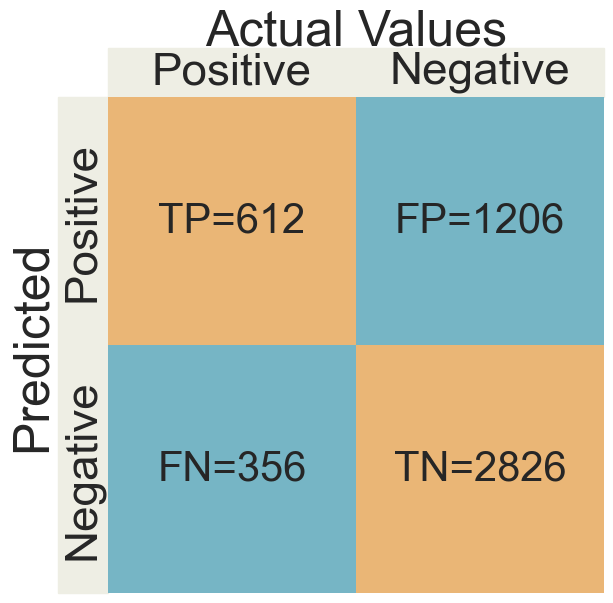

In [60]:
cm = cf_matrix
sns.set(font_scale=3)
plt.figure(figsize=(7, 7))
ax = sns.heatmap(data=[[1, 0], [0, 1]], cmap=sns.color_palette(['#76b5c5', '#eab676'], as_cmap=True),
                 annot=[[f"TP={cm[0][0]:.0f}", f"FP={cm[0][1]:.0f}"], [f"FN={cm[1][0]:.0f}", f"TN={cm[1][1]:.0f}"]],
                 fmt='', annot_kws={'fontsize': 30}, cbar=False, square=True)

ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted')
ax.tick_params(length=0, labeltop=True, labelbottom=False)
ax.xaxis.set_label_position('top')
ax.set_xticklabels(['Positive', 'Negative'])
ax.set_yticklabels(['Positive', 'Negative'], rotation=90, va='center')
ax.add_patch(plt.Rectangle((0, 1), 1, 0.1, color='#eeeee4', clip_on=False, zorder=0, transform=ax.transAxes))
ax.add_patch(plt.Rectangle((0, 0), -0.1, 1, color='#eeeee4', clip_on=False, zorder=0, transform=ax.transAxes))
plt.tight_layout()
plt.show()

In [61]:

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['Negative', 'Positive'], # Check your class names in the CSV file. It should be 1, 2, 3, 4, 5 I think
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=X_test.iloc[15],
    predict_fn=logmodel.predict_proba
)

exp.show_in_notebook(show_table=True)

# **Support Vector Machine**

In [62]:
from sklearn.svm import SVC
svc = SVC()
from sklearn.model_selection import GridSearchCV

In [63]:
params= {'C': [0.1,1000], 'gamma':[1,0,0.0001]}

In [64]:
svc_grid= GridSearchCV(estimator=svc,
                    param_grid=params,
                    cv=10,
                    n_jobs=1,
                    verbose=3)

In [65]:
svc_grid.fit(X_train,y_train)

Fitting 10 folds for each of 6 candidates, totalling 60 fits
[CV 1/10] END ...................C=0.1, gamma=1;, score=0.691 total time=  45.6s
[CV 2/10] END ...................C=0.1, gamma=1;, score=0.698 total time=  39.0s
[CV 3/10] END ...................C=0.1, gamma=1;, score=0.680 total time=  39.9s
[CV 4/10] END ...................C=0.1, gamma=1;, score=0.684 total time=  44.7s
[CV 5/10] END ...................C=0.1, gamma=1;, score=0.689 total time=  42.4s
[CV 6/10] END ...................C=0.1, gamma=1;, score=0.690 total time=  43.4s
[CV 7/10] END ...................C=0.1, gamma=1;, score=0.702 total time=  47.6s
[CV 8/10] END ...................C=0.1, gamma=1;, score=0.691 total time=  43.3s
[CV 9/10] END ...................C=0.1, gamma=1;, score=0.700 total time=  43.0s
[CV 10/10] END ..................C=0.1, gamma=1;, score=0.679 total time=  43.5s
[CV 1/10] END ...................C=0.1, gamma=0;, score=0.636 total time=  27.3s
[CV 2/10] END ...................C=0.1, gamma=0;

GridSearchCV(cv=10, estimator=SVC(), n_jobs=1,
             param_grid={'C': [0.1, 1000], 'gamma': [1, 0, 0.0001]}, verbose=3)

In [66]:
svc_grid.best_params_

{'C': 1000, 'gamma': 0.0001}

In [67]:
svc = SVC(C= 1000, gamma= 0.0001, probability = True)

In [68]:
svc.fit(X_train,y_train)
prediction=svc.predict(X_test)

In [69]:
print(classification_report(y_test,prediction))
print("Train Accuracy: ", accuracy_score(y_train, svc.predict(X_train))) # compare training actual and predicted value
print("Test Accuracy: ", accuracy_score(y_test, prediction))

              precision    recall  f1-score   support

           0       0.67      0.29      0.41      1818
           1       0.69      0.92      0.79      3182

    accuracy                           0.69      5000
   macro avg       0.68      0.60      0.60      5000
weighted avg       0.69      0.69      0.65      5000

Train Accuracy:  0.693
Test Accuracy:  0.6908


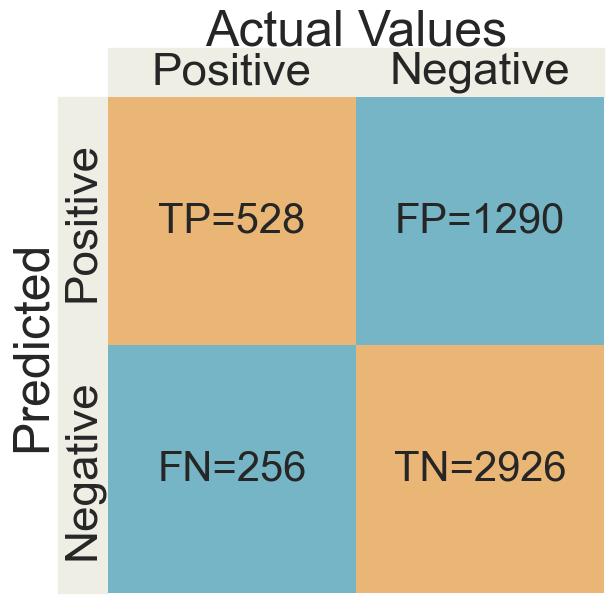

In [70]:
cf_matrix=confusion_matrix(y_test,prediction)
cm = cf_matrix
sns.set(font_scale=3)
plt.figure(figsize=(7, 7))
ax = sns.heatmap(data=[[1, 0], [0, 1]], cmap=sns.color_palette(['#76b5c5', '#eab676'], as_cmap=True),
                 annot=[[f"TP={cm[0][0]:.0f}", f"FP={cm[0][1]:.0f}"], [f"FN={cm[1][0]:.0f}", f"TN={cm[1][1]:.0f}"]],
                 fmt='', annot_kws={'fontsize': 30}, cbar=False, square=True)

ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted')
ax.tick_params(length=0, labeltop=True, labelbottom=False)
ax.xaxis.set_label_position('top')
ax.set_xticklabels(['Positive', 'Negative'])
ax.set_yticklabels(['Positive', 'Negative'], rotation=90, va='center')
ax.add_patch(plt.Rectangle((0, 1), 1, 0.1, color='#eeeee4', clip_on=False, zorder=0, transform=ax.transAxes))
ax.add_patch(plt.Rectangle((0, 0), -0.1, 1, color='#eeeee4', clip_on=False, zorder=0, transform=ax.transAxes))
plt.tight_layout()
plt.show()

In [71]:

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['Negative', 'Positive'], # Check your class names in the CSV file. It should be 1, 2, 3, 4, 5 I think
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=X_test.iloc[10],
    predict_fn=svc.predict_proba
)

exp.show_in_notebook(show_table=True)

# **Naive Bayes**

In [72]:
from sklearn.naive_bayes import BernoulliNB


In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify = y)
n_classes = np.unique(y)

In [74]:
params = {'alpha': [0.01, 0.1, 0.5, 1.0, 10.0],
          'fit_prior': [True, False],
          'class_prior': [None, [0.1,]* len(n_classes), ],
          'binarize': [None, 0.0, 8.5, 10.0]
         }

In [75]:
bernoulli_nb_grid = GridSearchCV(BernoulliNB(), param_grid=params, n_jobs=-1, cv=5, verbose=5)
bernoulli_nb_grid.fit(X_train,y_train)

print('Best Parameters : {}'.format(bernoulli_nb_grid.best_params_))
print('Best Accuracy Through Grid Search : {:.3f}\n'.format(bernoulli_nb_grid.best_score_))

Fitting 5 folds for each of 80 candidates, totalling 400 fits
Best Parameters : {'alpha': 10.0, 'binarize': None, 'class_prior': None, 'fit_prior': True}
Best Accuracy Through Grid Search : 0.689



In [76]:
NB = BernoulliNB(alpha= 10.0, binarize= None, class_prior= None, fit_prior= True)
NB.fit(X_train,y_train)
prediction=NB.predict(X_test)

In [77]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

print(classification_report(y_test,prediction))
print("Train Accuracy: ", accuracy_score(y_train, NB.predict(X_train))) # compare training actual and predicted value
print("Test Accuracy: ", accuracy_score(y_test, prediction))

              precision    recall  f1-score   support

           0       0.63      0.35      0.45      1818
           1       0.70      0.88      0.78      3182

    accuracy                           0.69      5000
   macro avg       0.67      0.62      0.62      5000
weighted avg       0.68      0.69      0.66      5000

Train Accuracy:  0.68775
Test Accuracy:  0.689


In [78]:
cf_matrix=confusion_matrix(y_test,prediction)

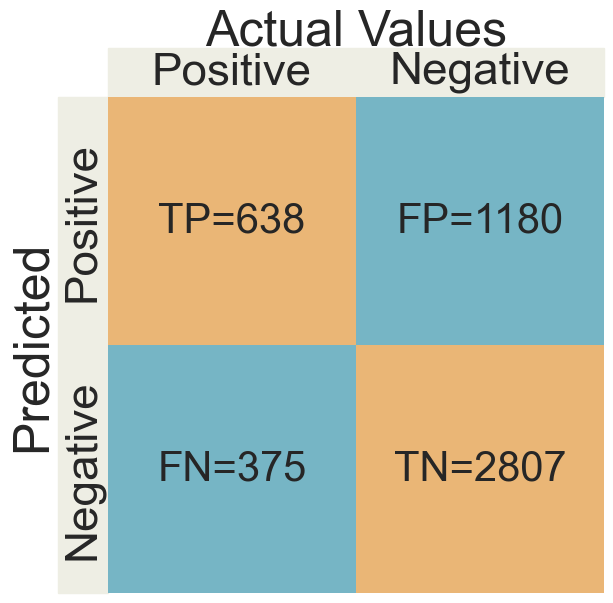

In [79]:
cm = cf_matrix
sns.set(font_scale=3)
plt.figure(figsize=(7, 7))
ax = sns.heatmap(data=[[1, 0], [0, 1]], cmap=sns.color_palette(['#76b5c5', '#eab676'], as_cmap=True),
                 annot=[[f"TP={cm[0][0]:.0f}", f"FP={cm[0][1]:.0f}"], [f"FN={cm[1][0]:.0f}", f"TN={cm[1][1]:.0f}"]],
                 fmt='', annot_kws={'fontsize': 30}, cbar=False, square=True)

ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted')
ax.tick_params(length=0, labeltop=True, labelbottom=False)
ax.xaxis.set_label_position('top')
ax.set_xticklabels(['Positive', 'Negative'])
ax.set_yticklabels(['Positive', 'Negative'], rotation=90, va='center')
ax.add_patch(plt.Rectangle((0, 1), 1, 0.1, color='#eeeee4', clip_on=False, zorder=0, transform=ax.transAxes))
ax.add_patch(plt.Rectangle((0, 0), -0.1, 1, color='#eeeee4', clip_on=False, zorder=0, transform=ax.transAxes))
plt.tight_layout()
plt.show()

In [80]:
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['0', '1'], # Check your class names in the CSV file. It should be 1, 2, 3, 4, 5 I think
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=X_test.iloc[20],
    predict_fn=NB.predict_proba
)

exp.show_in_notebook(show_table=True)